## Master Thesis - Feature Extraction & Statistics

In [1]:
# Imports

import pandas as pd
import json
import os
import matplotlib.pyplot as plt
import numpy as np
import neurokit2 as nk

from io import StringIO
from scipy.signal import find_peaks

import statsmodels.api as sm
from statsmodels.regression.mixed_linear_model import MixedLM
import statsmodels.formula.api as smf


### 1. Load Data

This notebook relies on data that was previously created with the pipeline.ipynb

In [2]:
# Load from Pickle
eda_df_filtered = pd.read_pickle('eda_df_filtered_without_walking_files.pkl')

In [268]:
eda_df_filtered.head(5)

,Participant,leda_baseline.txt,leda_1a.txt,leda_1i.txt,leda_2a.txt,leda_2i.txt,leda_3a.txt,leda_3i.txt,leda_4a.txt,leda_4i.txt,leda_5a.txt,leda_5i.txt,Participant_Number
0,pb26 - MMO02,"{'timestamps': [0.0, 0.0010001, 0.0020001, 0.0...","{'timestamps': [0.0, 0.00099998, 0.002, 0.0029...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.00099996, 0.0019999, 0....","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.0020001, 0.00300...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.0030001, ...",26
1,pb30 - CAN61,"{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.0030001, ...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.0020001, 0.00300...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.00099998, 0.002, 0.003,...",30
2,pb35 - BRE26,"{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.0030001, ...","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.00099995, 0.0019999, 0....","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...",35
3,pb37 - CCN18,"{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.0020001, 0.00300...","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...",37
4,pb27 - STG27,"{'timestamps': [0.0, 0.0010001, 0.0020002, 0.0...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.00099996, 0.0019999, 0....","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.0010001, 0.0020001, 0.0...","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.001, 0.002, 0.0030001, ...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...",27


#### 1.1 Sort dataframe according to participant's IDs ascendingly 

In [4]:
# Extract the number after 'pb' in the Participant column (e.g., 'pb39 - IKE31' -> 39)
eda_df_filtered['Participant_Number'] = eda_df_filtered['Participant'].str.extract(r'pb(\d+)').astype(int)

# Sort the DataFrame by the extracted number (ascending order)
eda_df_filtered_sorted = eda_df_filtered.sort_values(by='Participant_Number', ascending=True)

# Drop the helper column 'Participant_Number' after sorting
eda_df_filtered_sorted = eda_df_filtered_sorted.drop(columns='Participant_Number')

# Display the sorted DataFrame
eda_df_filtered_sorted.head(5)

,Participant,leda_baseline.txt,leda_1a.txt,leda_1i.txt,leda_2a.txt,leda_2i.txt,leda_3a.txt,leda_3i.txt,leda_4a.txt,leda_4i.txt,leda_5a.txt,leda_5i.txt
30,pb13 - AWD17,NaN,"{'timestamps': [0.48488, 0.48588, 0.48688, 0.4...","{'timestamps': [0.0, 0.0009999, 0.0019998, 0.0...","{'timestamps': [0.0, 0.00099996, 0.0019999, 0....","{'timestamps': [0.34701, 0.34801, 0.34901, 0.3...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.42984, 0.43084, 0.43184, 0.4...","{'timestamps': [0.21936, 0.22036, 0.22136, 0.2...","{'timestamps': [0.36814, 0.36914, 0.37014, 0.3...","{'timestamps': [0.241, 0.242, 0.243, 0.244, 0....","{'timestamps': [0.55182, 0.55282, 0.55382, 0.5..."
13,pb14 - MAN14,"{'timestamps': [0.0, 0.00099998, 0.002, 0.0029...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.001, 0.002, 0.0030001, ...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.0030001, ...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00..."
12,pb15 - ONK28,"{'timestamps': [0.0, 0.0010001, 0.0020001, 0.0...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.0030001, ...","{'timestamps': [0.0, 0.00099993, 0.0019999, 0....","{'timestamps': [0.0, 0.00099998, 0.002, 0.0029...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.00099982, 0.0019996, 0....","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.00099998, 0.002, 0.0029...","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00..."
16,pb16 - KKN25,"{'timestamps': [0.0, 0.0010001, 0.0020001, 0.0...","{'timestamps': [0.0, 0.00099953, 0.0019991, 0....","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.00099998, 0.0019999, 0....","{'timestamps': [0.0, 0.00099996, 0.0019999, 0....","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.00099996, 0.0019999, 0....","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.001, 0.0020001, 0.00300...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00..."
31,pb17 - AEW02,"{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.001, 0.002, 0.0030001, ...","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00..."


#### 1.3 Check for NaN values

In [5]:
# Show rows where any column has NaN values
nan_rows = eda_df_filtered_sorted[eda_df_filtered_sorted.isna().any(axis=1)]

# Display the rows with NaN values
nan_rows

,Participant,leda_baseline.txt,leda_1a.txt,leda_1i.txt,leda_2a.txt,leda_2i.txt,leda_3a.txt,leda_3i.txt,leda_4a.txt,leda_4i.txt,leda_5a.txt,leda_5i.txt
30,pb13 - AWD17,NaN,"{'timestamps': [0.48488, 0.48588, 0.48688, 0.4...","{'timestamps': [0.0, 0.0009999, 0.0019998, 0.0...","{'timestamps': [0.0, 0.00099996, 0.0019999, 0....","{'timestamps': [0.34701, 0.34801, 0.34901, 0.3...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.42984, 0.43084, 0.43184, 0.4...","{'timestamps': [0.21936, 0.22036, 0.22136, 0.2...","{'timestamps': [0.36814, 0.36914, 0.37014, 0.3...","{'timestamps': [0.241, 0.242, 0.243, 0.244, 0....","{'timestamps': [0.55182, 0.55282, 0.55382, 0.5..."


#### 1.4 Remove rows with NaN values

As we can see only one participant contains a NaN value, so this participant needs to be excluded from the dataframe before further processing. 

In [6]:
# Drop rows that contain any NaN values
eda_df_filtered_cleaned = eda_df_filtered_sorted.dropna()

# Display the cleaned DataFrame
eda_df_filtered_cleaned.head(5)

,Participant,leda_baseline.txt,leda_1a.txt,leda_1i.txt,leda_2a.txt,leda_2i.txt,leda_3a.txt,leda_3i.txt,leda_4a.txt,leda_4i.txt,leda_5a.txt,leda_5i.txt
13,pb14 - MAN14,"{'timestamps': [0.0, 0.00099998, 0.002, 0.0029...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.001, 0.002, 0.0030001, ...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.0030001, ...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00..."
12,pb15 - ONK28,"{'timestamps': [0.0, 0.0010001, 0.0020001, 0.0...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.0030001, ...","{'timestamps': [0.0, 0.00099993, 0.0019999, 0....","{'timestamps': [0.0, 0.00099998, 0.002, 0.0029...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.00099982, 0.0019996, 0....","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.00099998, 0.002, 0.0029...","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00..."
16,pb16 - KKN25,"{'timestamps': [0.0, 0.0010001, 0.0020001, 0.0...","{'timestamps': [0.0, 0.00099953, 0.0019991, 0....","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.00099998, 0.0019999, 0....","{'timestamps': [0.0, 0.00099996, 0.0019999, 0....","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.00099996, 0.0019999, 0....","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.001, 0.0020001, 0.00300...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00..."
31,pb17 - AEW02,"{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.001, 0.002, 0.0030001, ...","{'timestamps': [0.0, 0.00099999, 0.002, 0.003,...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00..."
5,pb18 - WJG24,"{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.00099986, 0.0019997, 0....","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00...","{'timestamps': [0.0, 0.001, 0.0020001, 0.00300...","{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00..."


### 2. Transform Data

In [7]:
# Define the mapping for the new columns 'Typology' and 'Position'
file_mapping = {
    "leda_baseline.txt": ("Baseline", "Baseline"),
    "leda_1a.txt": ("CPS", "Peripheral"),
    "leda_1i.txt": ("CPS", "Central"),
    "leda_2a.txt": ("GS", "Peripheral"),
    "leda_2i.txt": ("GS", "Central"),
    "leda_3a.txt": ("BSS", "Peripheral"),
    "leda_3i.txt": ("BSS", "Central"),
    "leda_4a.txt": ("LPS", "Peripheral"),
    "leda_4i.txt": ("LPS", "Central"),
    "leda_5a.txt": ("TI", "Peripheral"),
    "leda_5i.txt": ("TI", "Central")
}

In [8]:
# Check the length of file_mapping
print(f"Total entries in file_mapping: {len(file_mapping)}")


Total entries in file_mapping: 11


In [9]:
# Initialize a list to store rows of the new DataFrame
eda_transformed_data = []

# Iterate through each row in the DataFrame
for index, row in eda_df_filtered_cleaned.iterrows():
    participant = row["Participant"]  # Get the participant ID

    # Process each file
    for file_name, (typology, position) in file_mapping.items():
        # Check if the file_name column exists
        if file_name in eda_df_filtered_cleaned.columns:
            # Safely access the EDA signal
            eda_signal = eda_df_filtered_cleaned.at[index, file_name]
            
            # Ensure there's data for this location and it's not empty
            if eda_signal is not None and len(eda_signal) > 0:
                # Append a new row to the data list
                eda_transformed_data.append({
                    "Participant": participant,
                    "Typology": typology,
                    "Position": position,
                    "EDA_signal": eda_signal
                })
        else:
            print(f"Column {file_name} not found in DataFrame.")
        
        
# Convert the list of dictionaries into a new DataFrame
eda_transformed_df = pd.DataFrame(eda_transformed_data)


In [10]:
eda_transformed_df

,Participant,Typology,Position,EDA_signal
0,pb14 - MAN14,Baseline,Baseline,"{'timestamps': [0.0, 0.00099998, 0.002, 0.0029..."
1,pb14 - MAN14,CPS,Peripheral,"{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00..."
2,pb14 - MAN14,CPS,Central,"{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00..."
3,pb14 - MAN14,GS,Peripheral,"{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00..."
4,pb14 - MAN14,GS,Central,"{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00..."
...,...,...,...,...
391,pb50 - MJN06,BSS,Central,"{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00..."
392,pb50 - MJN06,LPS,Peripheral,"{'timestamps': [0.0, 0.00099999, 0.002, 0.003,..."
393,pb50 - MJN06,LPS,Central,"{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00..."
394,pb50 - MJN06,TI,Peripheral,"{'timestamps': [0.0, 0.001, 0.002, 0.003, 0.00..."


### 3. Extract EDA Signal

In [11]:
# Function to extract 'eda_values' from the EDA_signal dictionary
def extract_eda_values(eda_signal):
    if eda_signal and 'eda_values' in eda_signal:
        return eda_signal['eda_values']
    return None  # Return None if 'eda_values' key doesn't exist

# Create a new DataFrame by copying the existing one
eda_values_df = eda_transformed_df.copy()

# Apply the extraction function to the 'EDA_signal' column
eda_values_df['EDA_signal'] = eda_values_df['EDA_signal'].apply(lambda x: extract_eda_values(x))

# Show the first few rows to verify the result
eda_values_df

,Participant,Typology,Position,EDA_signal
0,pb14 - MAN14,Baseline,Baseline,"[6.91, 6.91, 6.91, 6.91, 6.91, 6.91, 6.91, 6.9..."
1,pb14 - MAN14,CPS,Peripheral,"[10.5, 10.5, 10.47, 10.47, 10.47, 10.5, 10.47,..."
2,pb14 - MAN14,CPS,Central,"[12.99, 12.99, 12.99, 12.99, 12.99, 12.99, 12...."
3,pb14 - MAN14,GS,Peripheral,"[12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12...."
4,pb14 - MAN14,GS,Central,"[16.94, 16.94, 16.92, 16.94, 16.92, 16.94, 16...."
...,...,...,...,...
391,pb50 - MJN06,BSS,Central,"[16.7, 16.7, 16.7, 16.72, 16.7, 16.7, 16.7, 16..."
392,pb50 - MJN06,LPS,Peripheral,"[18.63, 18.63, 18.63, 18.63, 18.63, 18.63, 18...."
393,pb50 - MJN06,LPS,Central,"[17.82, 17.82, 17.82, 17.82, 17.82, 17.82, 17...."
394,pb50 - MJN06,TI,Peripheral,"[16.94, 16.94, 16.94, 16.94, 16.94, 16.94, 16...."


### 4. Downsampling

In [12]:
# Function to downsample and round a single EDA signal
def downsample_signal(signal):
    # Ensure the signal is a valid 1D NumPy array
    signal = np.array(signal)
    
    # Check if the signal is long enough to be downsampled
    if len(signal) > 1:
        # Print the original signal length
        print(f"Original signal length: {len(signal)}")
        
        # Downsample the signal using NeuroKit's signal_resample function
        downsampled_signal = nk.signal_resample(signal, sampling_rate=1000, desired_sampling_rate=20)
        
        # Print the length of the downsampled signal to verify it worked
        print(f"Downsampled signal length: {len(downsampled_signal)}")
        
        # Round the downsampled signal to 2 decimal places
        downsampled_signal_rounded = np.round(downsampled_signal, 2)
        
        return downsampled_signal_rounded
    else:
        print(f"Signal too short or invalid: {signal}")
        return np.nan  # Return NaN for invalid signals

# List to store the downsampled signals
downsampled_signals = []

# Iterate through each row in the DataFrame
for index, row in eda_values_df.iterrows():
    eda_signal = row['EDA_signal']  # Access the EDA signal for the current row
    
    # Check if the signal is a valid array and not empty
    if isinstance(eda_signal, (list, np.ndarray)) and len(eda_signal) > 0:
        # Downsample the signal and append the result
        eda_downsampled = downsample_signal(eda_signal)
        downsampled_signals.append(eda_downsampled)
    else:
        print(f"Invalid signal at index {index}: {eda_signal}")
        downsampled_signals.append(np.nan)  # Append NaN if the signal is not valid

# Add the rounded downsampled signals as a new column in the DataFrame
eda_values_df['EDA_downsampled'] = downsampled_signals

# Display the updated DataFrame
eda_values_df


Original signal length: 180010
Downsampled signal length: 3600
Original signal length: 180003
Downsampled signal length: 3600
Original signal length: 180005
Downsampled signal length: 3600
Original signal length: 180003
Downsampled signal length: 3600
Original signal length: 180004
Downsampled signal length: 3600
Original signal length: 180007
Downsampled signal length: 3600
Original signal length: 179840
Downsampled signal length: 3597
Original signal length: 180005
Downsampled signal length: 3600
Original signal length: 180002
Downsampled signal length: 3600
Original signal length: 180004
Downsampled signal length: 3600
Original signal length: 180003
Downsampled signal length: 3600
Original signal length: 179995
Downsampled signal length: 3600
Original signal length: 180006
Downsampled signal length: 3600
Original signal length: 180002
Downsampled signal length: 3600
Original signal length: 180018
Downsampled signal length: 3600
Original signal length: 180009
Downsampled signal lengt

,Participant,Typology,Position,EDA_signal,EDA_downsampled
0,pb14 - MAN14,Baseline,Baseline,"[6.91, 6.91, 6.91, 6.91, 6.91, 6.91, 6.91, 6.9...","[6.91, 6.91, 6.93, 6.93, 6.96, 6.98, 7.01, 7.0..."
1,pb14 - MAN14,CPS,Peripheral,"[10.5, 10.5, 10.47, 10.47, 10.47, 10.5, 10.47,...","[10.5, 10.47, 10.47, 10.45, 10.45, 10.45, 10.4..."
2,pb14 - MAN14,CPS,Central,"[12.99, 12.99, 12.99, 12.99, 12.99, 12.99, 12....","[12.99, 13.01, 13.01, 13.01, 13.04, 13.04, 13...."
3,pb14 - MAN14,GS,Peripheral,"[12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12....","[12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12...."
4,pb14 - MAN14,GS,Central,"[16.94, 16.94, 16.92, 16.94, 16.92, 16.94, 16....","[16.94, 16.92, 16.92, 16.92, 16.89, 16.89, 16...."
...,...,...,...,...,...
391,pb50 - MJN06,BSS,Central,"[16.7, 16.7, 16.7, 16.72, 16.7, 16.7, 16.7, 16...","[16.7, 16.72, 16.75, 16.75, 16.75, 16.75, 16.7..."
392,pb50 - MJN06,LPS,Peripheral,"[18.63, 18.63, 18.63, 18.63, 18.63, 18.63, 18....","[18.63, 18.63, 18.65, 18.68, 18.7, 18.7, 18.7,..."
393,pb50 - MJN06,LPS,Central,"[17.82, 17.82, 17.82, 17.82, 17.82, 17.82, 17....","[17.82, 17.8, 17.8, 17.77, 17.75, 17.72, 17.7,..."
394,pb50 - MJN06,TI,Peripheral,"[16.94, 16.94, 16.94, 16.94, 16.94, 16.94, 16....","[16.94, 16.94, 16.97, 16.97, 16.97, 16.97, 16...."


### 5. Plot downsampled Data

In [20]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Define the color palette and custom order for typologies
custom_palette = sns.color_palette("husl", n_colors=len(eda_values_df['Typology'].unique()))
custom_order = ['GS', 'CPS', 'BSS', 'LPS', 'TI']
typology_colors = {typology: color for typology, color in zip(custom_order, custom_palette)}
typology_colors['Baseline'] = 'red'

# Configure the font and grid style
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 14
sns.set_style("whitegrid", {'axes.spines.top': False, 'axes.spines.right': False})

# Define participants and create an output directory
participants = eda_values_df['Participant'].unique()
output_folder = 'participant_eda_downsampled_plots'
os.makedirs(output_folder, exist_ok=True)

# Sampling rate for downsampled data
sampling_rate = 20  # in Hz
time_interval = 1 / sampling_rate  # Time interval in seconds

# Iterate through each participant to plot EDA_downsampled data
for participant in participants:
    participant_data = eda_values_df[eda_values_df['Participant'] == participant]
    baseline_data = participant_data[participant_data['Position'] == 'Baseline']
    central_data = participant_data[participant_data['Position'] == 'Central']
    peripheral_data = participant_data[participant_data['Position'] == 'Peripheral']
    
    # Create a figure with two subplots for Central and Peripheral
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

    # Plot Central position
    for typology in custom_order:
        typology_data = central_data[central_data['Typology'] == typology]
        
        if not typology_data.empty:
            eda_signal = typology_data['EDA_downsampled'].values[0]
            time_vector = np.arange(len(eda_signal)) * time_interval
            
            axes[0].plot(time_vector, eda_signal, label=typology, color=typology_colors[typology], linewidth=1.5)
    
    # Plot Baseline for Central, if available
    if not baseline_data.empty:
        baseline_signal = baseline_data['EDA_downsampled'].values[0]
        time_vector = np.arange(len(baseline_signal)) * time_interval
        axes[0].plot(time_vector, baseline_signal, label="Baseline", linestyle='--', color='red', linewidth=2)
    
    axes[0].set_title(f'Central - {participant}')
    axes[0].set_xlabel('Time (s)')
    axes[0].set_ylabel('Microsiemens')
    axes[0].legend(title="Typology", loc="upper right")

    # Plot Peripheral position
    for typology in custom_order:
        typology_data = peripheral_data[peripheral_data['Typology'] == typology]
        
        if not typology_data.empty:
            eda_signal = typology_data['EDA_downsampled'].values[0]
            time_vector = np.arange(len(eda_signal)) * time_interval
            
            axes[1].plot(time_vector, eda_signal, label=typology, color=typology_colors[typology], linewidth=1.5)

    # Plot Baseline for Peripheral, if available
    if not baseline_data.empty:
        baseline_signal = baseline_data['EDA_downsampled'].values[0]
        time_vector = np.arange(len(baseline_signal)) * time_interval
        axes[1].plot(time_vector, baseline_signal, label="Baseline", linestyle='--', color='red', linewidth=2)
    
    axes[1].set_title(f'Peripheral - {participant}')
    axes[1].set_xlabel('Time (s)')
    axes[1].set_ylabel('Microsiemens')
    axes[1].legend(title="Typology", loc="upper right")

    # Save and close the plot
    plt.tight_layout()
    plot_filename = f"{output_folder}/{participant}_eda_downsampled_plot.png"
    plt.savefig(plot_filename, format='png', bbox_inches='tight', dpi=300)
    plt.close(fig)

print(f"All plots have been saved to the folder: {output_folder}")


All plots have been saved to the folder: participant_eda_downsampled_plots


### 6. Pre-Processing: Filtering & Decomposition

In [21]:
import neurokit2 as nk

# Create a copy of the DataFrame
eda_decomposed_df = eda_values_df.copy()

sampling_rate = 20

# Function to clean the EDA signal and decompose it into phasic and tonic components
def clean_and_decompose_eda_signal(eda_signal):
    if eda_signal is not None and len(eda_signal) > 0:
        # Clean the EDA signal using the 'biosppy' method
        eda_cleaned = nk.eda_clean(eda_signal, sampling_rate=sampling_rate, method='biosppy')

        print("Check Clean")
        # Decompose the cleaned signal into tonic and phasic components using the 'cvxeda' method
        eda_decomposed = nk.eda_phasic(eda_cleaned, sampling_rate=sampling_rate, method='cvxeda')
        
        # Extract the tonic and phasic components
        tonic = eda_decomposed["EDA_Tonic"].tolist()
        phasic = eda_decomposed["EDA_Phasic"].tolist()
        
        return eda_cleaned, tonic, phasic
    return None, None, None

# Apply the cleaning and decomposition function to each row
clean_tonic_phasic_components = eda_decomposed_df['EDA_downsampled'].apply(lambda x: clean_and_decompose_eda_signal(x))

# Split the results into clean, tonic, and phasic components
eda_decomposed_df['EDA_Clean'] = clean_tonic_phasic_components.apply(lambda x: x[0])  # Cleaned signal
eda_decomposed_df['EDA_Tonic'] = clean_tonic_phasic_components.apply(lambda x: x[1])  # Tonic component
eda_decomposed_df['EDA_Phasic'] = clean_tonic_phasic_components.apply(lambda x: x[2])  # Phasic component

# Display the updated DataFrame
eda_decomposed_df


Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Check Clean
Chec

,Participant,Typology,Position,EDA_signal,EDA_downsampled,EDA_Clean,EDA_Tonic,EDA_Phasic
0,pb14 - MAN14,Baseline,Baseline,"[6.91, 6.91, 6.91, 6.91, 6.91, 6.91, 6.91, 6.9...","[6.91, 6.91, 6.93, 6.93, 6.96, 6.98, 7.01, 7.0...","[6.942727306657284, 6.9481153564665625, 6.9555...","[6.910251686087993, 6.913581108260152, 6.91691...","[0.0, 0.0, 0.012289562466185108, 0.03175910695..."
1,pb14 - MAN14,CPS,Peripheral,"[10.5, 10.5, 10.47, 10.47, 10.47, 10.5, 10.47,...","[10.5, 10.47, 10.47, 10.45, 10.45, 10.45, 10.4...","[10.471718316448104, 10.468895858328672, 10.46...","[10.401787557206694, 10.40473506409515, 10.407...","[0.0, 0.0, 0.10530498458678046, 0.082043556179..."
2,pb14 - MAN14,CPS,Central,"[12.99, 12.99, 12.99, 12.99, 12.99, 12.99, 12....","[12.99, 13.01, 13.01, 13.01, 13.04, 13.04, 13....","[13.010079271932252, 13.01190041645853, 13.014...","[12.953124955775241, 12.953708176378811, 12.95...","[0.0, 0.0, 0.1490512462440779, 0.1302198617578..."
3,pb14 - MAN14,GS,Peripheral,"[12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12....","[12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12....","[12.305868718284792, 12.30952846007988, 12.315...","[12.228711211182407, 12.229097469895903, 12.22...","[0.0, 0.0, 0.044380802589346846, 0.07560966008..."
4,pb14 - MAN14,GS,Central,"[16.94, 16.94, 16.92, 16.94, 16.92, 16.94, 16....","[16.94, 16.92, 16.92, 16.92, 16.89, 16.89, 16....","[16.920356028977555, 16.91841956052293, 16.915...","[16.871889051848353, 16.867898008715457, 16.86...","[0.0, 0.0, 0.04073045704988815, 0.043792681064..."
...,...,...,...,...,...,...,...,...
391,pb50 - MJN06,BSS,Central,"[16.7, 16.7, 16.7, 16.72, 16.7, 16.7, 16.7, 16...","[16.7, 16.72, 16.75, 16.75, 16.75, 16.75, 16.7...","[16.723762063286628, 16.725428095477383, 16.72...","[16.741268566693105, 16.74210049435897, 16.742...","[0.0, 0.0, -0.01966503503830791, -0.0158562477..."
392,pb50 - MJN06,LPS,Peripheral,"[18.63, 18.63, 18.63, 18.63, 18.63, 18.63, 18....","[18.63, 18.63, 18.65, 18.68, 18.7, 18.7, 18.7,...","[18.65619143728909, 18.65807922638178, 18.6605...","[18.625918347503536, 18.624980279574267, 18.62...","[0.0, 0.0, 0.02039807400588156, 0.032058224051..."
393,pb50 - MJN06,LPS,Central,"[17.82, 17.82, 17.82, 17.82, 17.82, 17.82, 17....","[17.82, 17.8, 17.8, 17.77, 17.75, 17.72, 17.7,...","[17.777210594350905, 17.771100975203858, 17.76...","[17.62816075021488, 17.622731419208268, 17.617...","[0.0, 0.0, 0.24175625736629164, 0.209100087688..."
394,pb50 - MJN06,TI,Peripheral,"[16.94, 16.94, 16.94, 16.94, 16.94, 16.94, 16....","[16.94, 16.94, 16.97, 16.97, 16.97, 16.97, 16....","[16.95591244215938, 16.95780860218524, 16.9604...","[16.95466908954091, 16.95394163996092, 16.9531...","[0.0, 0.0, -0.015529427791151618, -0.000812517..."


In [22]:
# Save as Pickle
eda_decomposed_df.to_pickle('eda_cvxeda_processed_20hz.pkl')

In [2]:
# Load from Pickle
eda_decomposed_df = pd.read_pickle('eda_cvxeda_processed_20hz.pkl')

In [8]:
# Check the length of lists or indicate non-list types for the first row in each column
lengths = {}
for column in eda_decomposed_df.columns:
    if isinstance(eda_decomposed_df[column].iloc[0], list):
        lengths[column] = len(eda_decomposed_df[column].iloc[0])
    else:
        lengths[column] = 'Not a list'

# Display the result
print(lengths)



{'Participant': 'Not a list', 'Typology': 'Not a list', 'Position': 'Not a list', 'EDA_signal': 180010, 'EDA_downsampled': 'Not a list', 'EDA_Clean': 'Not a list', 'EDA_Tonic': 3600, 'EDA_Phasic': 3600}


In [4]:
print(len(eda_decomposed_df))


396


### 7. Flag incomplete and saturated signals

In [5]:
import numpy as np
import pandas as pd

# Make a copy of the dataframe with a meaningful name
eda_quality_flagged_df = eda_decomposed_df.copy()

# Round EDA_Tonic and EDA_Phasic to four decimal places
eda_quality_flagged_df['EDA_Tonic'] = eda_quality_flagged_df['EDA_Tonic'].apply(
    lambda x: [round(val, 4) for val in x] if isinstance(x, list) else x)
eda_quality_flagged_df['EDA_Phasic'] = eda_quality_flagged_df['EDA_Phasic'].apply(
    lambda x: [round(val, 4) for val in x] if isinstance(x, list) else x)

# Define constants
sampling_rate = 20  # Hz
recording_duration = 180  # seconds
total_samples = sampling_rate * recording_duration  # 3600 samples
half_duration_threshold = total_samples // 2  # 1800 samples
saturation_threshold = int(2.5 * sampling_rate)  # 50 samples (2.5 sec * 20 Hz)

### Function to flag incomplete signals
def flag_incomplete_signal(signal, threshold=half_duration_threshold):
    if isinstance(signal, list):
        actual_length = len(signal)
        return 1 if actual_length < threshold else 0  # 1 if too short, else 0
    return 1  # If it's not a list, assume it's completely missing

### Function to count total saturated samples (fixes the issue with scattered saturation)
def count_saturation(signal, threshold=50):
    if not isinstance(signal, list):
        return 0  # Skip non-list values
    
    signal = np.array(signal)
    diff_signal = np.diff(signal)  # Compute first-order difference
    saturation_mask = (diff_signal == 0)  # True where signal stays the same
    saturation_mask = np.concatenate(([False], saturation_mask))  # Align shape

    # Count how many total samples belong to saturated regions
    total_saturated_samples = 0
    count = 0

    for i in range(len(saturation_mask)):
        if saturation_mask[i]:  
            count += 1
        else:
            if count >= threshold:  
                total_saturated_samples += count  # Add all valid saturated segments
            count = 0  

    # Include the last segment if it was still ongoing at the end
    if count >= threshold:
        total_saturated_samples += count

    return total_saturated_samples

### Function to create a saturation mask for each signal
def create_saturation_mask(signal, threshold=50):
    if not isinstance(signal, list):
        return []  # Return empty list if invalid

    signal = np.array(signal)
    diff_signal = np.diff(signal)
    saturation_mask = (diff_signal == 0)  # Identify where values stay the same
    saturation_mask = np.concatenate(([False], saturation_mask))  # Align shape

    # Convert to list where 1 = saturated, 0 = valid
    return [1 if saturation_mask[i] else 0 for i in range(len(saturation_mask))]

### **✅ FIXED: Function to create an incomplete mask (match signal length)**
def create_incomplete_mask(signal):
    """
    Creates an incomplete mask matching the length of the actual signal.

    Parameters:
        signal (list): The input signal.

    Returns:
        list: Binary mask of the same length as the signal, all values 0.
    """
    if not isinstance(signal, list):
        return []  # Return empty list if invalid

    actual_length = len(signal)  # Ensure the mask is the same length as the signal
    return [0] * actual_length  # All valid points

# Apply missing data check (binary flag instead of counting missing samples)
eda_quality_flagged_df['Incomplete_Flag'] = eda_quality_flagged_df['EDA_Tonic'].apply(flag_incomplete_signal)

# Apply saturation check (count total number of saturated samples)
eda_quality_flagged_df['Total_Saturation'] = eda_quality_flagged_df['EDA_Tonic'].apply(count_saturation)

# Flag signals where total saturation exceeds half the recording duration
eda_quality_flagged_df['Saturation_Flag'] = (eda_quality_flagged_df['Total_Saturation'] >= half_duration_threshold).astype(int)

# Add a combined flag: 1 if either Incomplete or Saturated
eda_quality_flagged_df['Quality_Flag'] = (
    (eda_quality_flagged_df['Incomplete_Flag'] == 1) |  
    (eda_quality_flagged_df['Saturation_Flag'] == 1)
).astype(int)

# Apply masks for detailed tracking of missing and saturated points
eda_quality_flagged_df['saturation_mask'] = eda_quality_flagged_df['EDA_Tonic'].apply(create_saturation_mask)
eda_quality_flagged_df['incomplete_mask'] = eda_quality_flagged_df['EDA_Tonic'].apply(create_incomplete_mask)

# Drop the raw 'Total_Saturation' count column for clarity
eda_quality_flagged_df.drop(columns=['Total_Saturation'], inplace=True)


#### 7.1 Number of saturated or incomplete signals or both (more than half of the recorded signal length)

In [6]:
# Count the number of signals flagged as incomplete, saturated, and both
num_incomplete = eda_quality_flagged_df['Incomplete_Flag'].sum()
num_saturated = eda_quality_flagged_df['Saturation_Flag'].sum()
num_both = eda_quality_flagged_df['Quality_Flag'].sum()

# Print the results
print(f"Number of Incomplete Signals: {num_incomplete}")
print(f"Number of Saturated Signals: {num_saturated}")
print(f"Number of Signals Flagged as Both: {num_both}")

# Get the total number of signals
total_signals = len(eda_quality_flagged_df)

# Print the total number of signals
print(f"Total Number of Signals in Dataset: {total_signals}")

Number of Incomplete Signals: 6
Number of Saturated Signals: 54
Number of Signals Flagged as Both: 60
Total Number of Signals in Dataset: 396


#### 7.2 Remove saturated and incomplete signals (more than half of the recorded signal length)

In [7]:
# Create a new dataframe containing only valid signals
eda_valid_signals_df = eda_quality_flagged_df[eda_quality_flagged_df['Quality_Flag'] == 0].copy()

# Reset index after filtering and drop the old index
eda_valid_signals_df.reset_index(drop=True, inplace=True)

# Display the first few rows to verify
# print(eda_valid_signals_df.head())


In [8]:
print(len(eda_valid_signals_df))

336


#### 7.3 Extract indices of saturated or missing data points 

In [9]:
import numpy as np
import pandas as pd

# Make a copy of the valid signals dataframe
eda_signal_masked_df = eda_valid_signals_df.copy()

# Define constants
sampling_rate = 20  # Hz
recording_duration = 180  # seconds
total_samples = sampling_rate * recording_duration  # 3600 samples
saturation_threshold = int(2.5 * sampling_rate)  # 50 samples (2.5 sec * 20 Hz)

### Function to create saturation mask
def create_saturation_mask(signal, threshold=saturation_threshold):
    if not isinstance(signal, list):
        return []  # Return empty list if signal is missing
    signal = np.array(signal)
    mask = np.zeros(len(signal), dtype=int)  # Initialize all values as 0 (valid)

    # Compute differences to detect constant regions
    diff_signal = np.diff(signal)
    saturation_mask = np.concatenate(([False], diff_signal == 0))  # True where signal is constant

    count = 0
    for i in range(len(saturation_mask)):
        if saturation_mask[i]:  
            count += 1
        else:
            if count >= threshold:  
                mask[i - count:i] = 1  # Mark saturated segment
            count = 0  # Reset counter

    # Handle case where last segment was saturated
    if count >= threshold:
        mask[len(signal) - count:] = 1

    return mask.tolist()

### Function to create incomplete mask (✅ FIXED)
def create_incomplete_mask(signal):
    if not isinstance(signal, list):
        return []  # Return empty list if signal is missing

    actual_length = len(signal)
    mask = np.zeros(actual_length, dtype=int)  # Match mask length to signal

    return mask.tolist()

# Apply saturation mask creation
eda_signal_masked_df['saturation_mask'] = eda_signal_masked_df['EDA_Tonic'].apply(create_saturation_mask)

# Apply incomplete mask creation (✅ FIXED)
eda_signal_masked_df['incomplete_mask'] = eda_signal_masked_df['EDA_Tonic'].apply(create_incomplete_mask)


In [10]:
# Function to check if a list contains at least one '1'
def contains_flag(mask_list):
    return 1 in mask_list if isinstance(mask_list, list) else False

# Filter rows where saturation or incomplete mask contains '1'
flagged_rows_df = eda_signal_masked_df[
    eda_signal_masked_df['saturation_mask'].apply(contains_flag) # | eda_signal_masked_df['incomplete_mask'].apply(contains_flag)
]

print(flagged_rows_df)

      Participant  Typology    Position  \
23   pb16 - KKN25       CPS     Central   
24   pb16 - KKN25        GS     Central   
67   pb21 - AGO11  Baseline    Baseline   
87   pb22 - GRR10        TI  Peripheral   
137  pb28 - EFN19        TI     Central   
139  pb29 - GMG06       CPS  Peripheral   
148  pb30 - CAN61       CPS     Central   
224  pb38 - MUH08        GS     Central   
271  pb43 - IVZ24  Baseline    Baseline   
286  pb46 - GAR28  Baseline    Baseline   
289  pb46 - GAR28       BSS  Peripheral   
290  pb46 - GAR28       BSS     Central   

                                            EDA_signal  \
23   [24.9, 24.9, 24.9, 24.9, 24.9, 24.9, 24.9, 24....   
24   [24.9, 24.9, 24.9, 24.9, 24.9, 24.9, 24.9, 24....   
67   [24.9, 24.9, 24.9, 24.9, 24.9, 24.9, 24.9, 24....   
87   [16.02, 16.02, 16.02, 16.02, 16.02, 16.02, 16....   
137  [24.9, 24.9, 24.9, 24.9, 24.9, 24.9, 24.9, 24....   
139  [24.9, 24.9, 24.9, 24.9, 24.9, 24.9, 24.9, 24....   
148  [24.9, 24.9, 24.9, 24.9, 24.9

### 8. Extract Timestamps of extreme peaks

In [11]:
import numpy as np
import pandas as pd

# Make a copy of the valid signals dataframe for peak detection
eda_peaks_masked_df = eda_signal_masked_df.copy()

# Define peak detection parameters
sampling_rate = 20
threshold = 0.03  # Adjusted threshold for peak detection
peak_length = 100  # Number of additional datapoints before and after to mark as part of the peak

### Function to detect peak artifacts
def detect_peaks(signal, threshold=0.03, peak_length=100):
    """
    Marks peaks in the signal if the absolute difference between neighboring points exceeds a threshold.
    The next peak_length points and the same number of preceding points are also marked as part of the peak.

    Parameters:
        signal (list or np.array): The signal to analyze.
        threshold (float): The minimum absolute difference between neighboring points to flag as a peak start.
        peak_length (int): Number of additional datapoints before and after to mark as part of the peak.

    Returns:
        peak_mask (list): A list of the same length as the signal, where 1 marks a peak and 0 marks the rest.
    """
    if not isinstance(signal, list):
        return []  # Return empty list if signal is missing
    
    peak_mask = [0] * len(signal)  # Initialize all points as non-peaks

    for i in range(1, len(signal)):
        diff = abs(signal[i] - signal[i - 1])  # Absolute difference between consecutive points
        if diff > threshold:
            # Mark this point and the next peak_length points as part of a peak
            for j in range(max(0, i - peak_length), min(i + peak_length, len(signal))):
                peak_mask[j] = 1

    return peak_mask

# Apply peak mask creation
eda_peaks_masked_df['peak_mask'] = eda_peaks_masked_df['EDA_Tonic'].apply(
    lambda x: detect_peaks(x, threshold=threshold, peak_length=peak_length)
)

# Display first few rows for verification
print(eda_peaks_masked_df[['peak_mask']].head())


                                           peak_mask
0  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
1  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
2  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
3  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
4  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...


In [12]:
# Function to check if a list contains at least one '1'
def contains_flag(mask_list):
    return 1 in mask_list if isinstance(mask_list, list) else False

# Filter rows where saturation or incomplete mask contains '1'
flagged_rows_df = eda_peaks_masked_df[
    eda_peaks_masked_df['peak_mask'].apply(contains_flag) # | eda_signal_masked_df['incomplete_mask'].apply(contains_flag)
]

print(flagged_rows_df)

      Participant  Typology    Position  \
19   pb15 - ONK28       LPS     Central   
25   pb16 - KKN25       LPS  Peripheral   
37   pb18 - WJG24  Baseline    Baseline   
126  pb27 - STG27       BSS  Peripheral   
130  pb27 - STG27        TI  Peripheral   
131  pb27 - STG27        TI     Central   
132  pb28 - EFN19  Baseline    Baseline   
134  pb28 - EFN19       LPS  Peripheral   
136  pb28 - EFN19        TI  Peripheral   
151  pb30 - CAN61       BSS  Peripheral   
195  pb35 - BRE26       LPS     Central   
244  pb40 - IMN29       CPS     Central   
248  pb40 - IMN29       BSS     Central   
260  pb41 - NGA35       LPS  Peripheral   
261  pb41 - NGA35       LPS     Central   
262  pb41 - NGA35        TI  Peripheral   
263  pb41 - NGA35        TI     Central   
275  pb44 - AWD10       CPS     Central   
283  pb44 - AWD10        TI     Central   

                                            EDA_signal  \
19   [20.07, 20.07, 20.07, 20.09, 20.07, 20.07, 20....   
25   [24.9, 24.9, 24.9,

### 9. Create summary mask

In [13]:
import numpy as np

# Function to create a summary mask by combining the three individual masks
def create_summary_mask(saturation_mask, incomplete_mask, peak_mask):
    """
    Creates a summary mask where 1 indicates the presence of an issue in any of the three masks,
    and 0 indicates a completely valid signal at that index.

    Parameters:
        saturation_mask (list): Binary list marking saturated points.
        incomplete_mask (list): Binary list marking missing points.
        peak_mask (list): Binary list marking detected peaks.

    Returns:
        summary_mask (list): Combined binary mask with 1 where any issue is detected.
    """
    # Ensure all masks are lists
    if not (isinstance(saturation_mask, list) and isinstance(incomplete_mask, list) and isinstance(peak_mask, list)):
        return []

    # Ensure all masks are the same length as the saturation mask (they should already be equal)
    mask_length = len(saturation_mask)

    # Convert to NumPy arrays
    saturation_mask = np.array(saturation_mask)
    incomplete_mask = np.array(incomplete_mask[:mask_length])  # Ensure correct length
    peak_mask = np.array(peak_mask[:mask_length])  # Ensure correct length

    # Create summary mask by taking the element-wise OR operation
    summary_mask = np.logical_or.reduce((saturation_mask, incomplete_mask, peak_mask)).astype(int)

    return summary_mask.tolist()

# Apply summary mask creation
eda_peaks_masked_df['summary_mask'] = eda_peaks_masked_df.apply(
    lambda row: create_summary_mask(row['saturation_mask'], row['incomplete_mask'], row['peak_mask']),
    axis=1
)




In [14]:
# Display first few rows for verification
print(eda_peaks_masked_df[['summary_mask']].head())

                                        summary_mask
0  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
1  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
2  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
3  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
4  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...


In [15]:
# Check and print the lengths of EDA_Phasic and masks for debugging
mismatch_details = []

for index, row in eda_peaks_masked_df.iterrows():
    phasic_length = len(row["EDA_Phasic"])
    saturation_length = len(row["saturation_mask"])
    incomplete_length = len(row["incomplete_mask"])
    peak_length = len(row["peak_mask"])
    summary_mask_length = len(row["summary_mask"])  # After applying the fix

    # Check if any mask length does not match the phasic signal length
    if (phasic_length != saturation_length or 
        phasic_length != incomplete_length or 
        phasic_length != peak_length or 
        phasic_length != summary_mask_length):
        
        mismatch_details.append((row["Participant"], row["Typology"], row["Position"], 
                                 phasic_length, saturation_length, incomplete_length, 
                                 peak_length, summary_mask_length))

# Print results
if mismatch_details:
    print(f"⚠️ {len(mismatch_details)} rows have mismatched lengths:")
    for participant, typology, position, ph_len, sat_len, inc_len, peak_len, sum_len in mismatch_details:
        print(f"Participant: {participant}, Typology: {typology}, Position: {position}, "
              f"Phasic: {ph_len}, Saturation: {sat_len}, Incomplete: {inc_len}, "
              f"Peak: {peak_len}, Summary Mask: {sum_len}")
else:
    print("✅ All signals and masks have matching lengths.")


✅ All signals and masks have matching lengths.


### 10. Calculate new mean

In [16]:
import numpy as np

# Function to compute mean of valid EDA_Tonic values
def compute_valid_tonic_mean(eda_tonic, summary_mask):
    """
    Computes the mean of EDA_Tonic values, considering only values where summary_mask is 0.
    
    Parameters:
        eda_tonic (list): The original EDA_Tonic signal.
        summary_mask (list): The mask indicating invalid (1) and valid (0) values.
    
    Returns:
        float: Mean of valid EDA_Tonic values, or NaN if no valid values exist.
    """
    if not isinstance(eda_tonic, list) or not isinstance(summary_mask, list):
        return np.nan  # Return NaN if data is not a list

    # Ensure both lists are of the same length
    min_length = min(len(eda_tonic), len(summary_mask))
    eda_tonic = eda_tonic[:min_length]  # Trim to min length if needed
    summary_mask = summary_mask[:min_length]  # Trim mask to match length

    # Filter valid EDA_Tonic values where summary_mask is 0
    valid_values = [val for val, mask in zip(eda_tonic, summary_mask) if mask == 0]

    # Compute mean, return NaN if no valid values exist
    return np.mean(valid_values) if valid_values else np.nan

# Apply the function to compute the mean of valid EDA_Tonic values
eda_peaks_masked_df['valid_tonic_mean'] = eda_peaks_masked_df.apply(
    lambda row: compute_valid_tonic_mean(row['EDA_Tonic'], row['summary_mask']),
    axis=1
)

# Display first few rows for verification
# print(eda_peaks_masked_df[['valid_tonic_mean']].head())


### 11. Adjust tonic component 

In [17]:
# Make a copy of the dataframe to preserve the original
eda_tonic_adjusted_df = eda_peaks_masked_df.copy()

# Function to replace flagged values with valid_tonic_mean
def adjust_tonic_signal(eda_tonic, summary_mask, valid_tonic_mean):
    """
    Creates a modified EDA_Tonic signal where flagged values (summary_mask=1) 
    are replaced with the valid_tonic_mean.

    Parameters:
        eda_tonic (list): Original EDA_Tonic signal.
        summary_mask (list): Mask indicating flagged indices (1 = replace, 0 = keep).
        valid_tonic_mean (float): The mean of valid (unflagged) EDA_Tonic values.

    Returns:
        list: Adjusted EDA_Tonic signal.
    """
    if not isinstance(eda_tonic, list) or not isinstance(summary_mask, list):
        return eda_tonic  # Return original if data is not a list

    # Ensure both lists are the same length
    min_length = min(len(eda_tonic), len(summary_mask))
    eda_tonic = eda_tonic[:min_length]  # Trim to match mask length
    summary_mask = summary_mask[:min_length]

    # Replace flagged values with valid_tonic_mean
    adjusted_signal = [
        valid_tonic_mean if mask == 1 else val 
        for val, mask in zip(eda_tonic, summary_mask)
    ]

    return adjusted_signal

# Apply the function to create the adjusted tonic signal
eda_tonic_adjusted_df['EDA_Tonic_Adjusted'] = eda_tonic_adjusted_df.apply(
    lambda row: adjust_tonic_signal(row['EDA_Tonic'], row['summary_mask'], row['valid_tonic_mean']),
    axis=1
)

# Display first few rows for verification
print(eda_tonic_adjusted_df[['EDA_Tonic', 'EDA_Tonic_Adjusted']].head())


                                           EDA_Tonic  \
0  [6.9103, 6.9136, 6.9169, 6.9202, 6.9236, 6.926...   
1  [10.4018, 10.4047, 10.4076, 10.4103, 10.413, 1...   
2  [12.9531, 12.9537, 12.9543, 12.9548, 12.9553, ...   
3  [12.2287, 12.2291, 12.2294, 12.2296, 12.2298, ...   
4  [16.8719, 16.8679, 16.8639, 16.8599, 16.8559, ...   

                                  EDA_Tonic_Adjusted  
0  [6.9103, 6.9136, 6.9169, 6.9202, 6.9236, 6.926...  
1  [10.4018, 10.4047, 10.4076, 10.4103, 10.413, 1...  
2  [12.9531, 12.9537, 12.9543, 12.9548, 12.9553, ...  
3  [12.2287, 12.2291, 12.2294, 12.2296, 12.2298, ...  
4  [16.8719, 16.8679, 16.8639, 16.8599, 16.8559, ...  


### 12. Phasic signal

In [18]:
import numpy as np
import pandas as pd

# Make a copy of the dataframe containing the adjusted tonic signal
eda_phasic_adjusted_df = eda_tonic_adjusted_df.copy()

# Function to adjust the phasic signal by keeping only valid values
def adjust_phasic_signal(eda_phasic, summary_mask):
    """
    Adjusts the phasic signal by removing values at indices flagged in the summary mask.

    Parameters:
        eda_phasic (list): Original phasic signal.
        summary_mask (list): Mask indicating artifact (1) or valid (0) data points.

    Returns:
        list: Adjusted phasic signal with flagged values removed.
    """
    if not isinstance(eda_phasic, list) or not isinstance(summary_mask, list):
        return []  # Return empty list if data is missing

    # Keep only values where the summary mask is 0 (valid)
    adjusted_phasic = [eda_phasic[i] for i in range(len(eda_phasic)) if summary_mask[i] == 0]

    return adjusted_phasic

# Apply function to create adjusted phasic signal
eda_phasic_adjusted_df['EDA_Phasic_Adjusted'] = eda_phasic_adjusted_df.apply(
    lambda row: adjust_phasic_signal(row['EDA_Phasic'], row['summary_mask']), axis=1
)

# Function to normalize the adjusted phasic signal by its length
def normalize_phasic_by_length(eda_phasic_adjusted):
    """
    Computes the mean of the adjusted phasic signal to normalize it per valid sample.

    Parameters:
        eda_phasic_adjusted (list): The adjusted phasic signal with flagged values removed.

    Returns:
        float: Normalized mean value of the adjusted phasic signal.
    """
    if not isinstance(eda_phasic_adjusted, list) or len(eda_phasic_adjusted) == 0:
        return np.nan  # Return NaN if signal is missing or empty

    # Compute mean of valid phasic values
    normalized_value = np.mean(eda_phasic_adjusted)

    return normalized_value

# Apply normalization function to compute one mean value per row
eda_phasic_adjusted_df['EDA_Phasic_Adjusted_Normalized'] = eda_phasic_adjusted_df['EDA_Phasic_Adjusted'].apply(
    normalize_phasic_by_length
)

# Display first few rows for verification
print(eda_phasic_adjusted_df[['EDA_Phasic_Adjusted_Normalized']].head())


   EDA_Phasic_Adjusted_Normalized
0                        0.287340
1                        0.367101
2                        0.730078
3                        0.303525
4                        0.368309


In [19]:
eda_phasic_adjusted_df.head(10)

,Participant,Typology,Position,EDA_signal,EDA_downsampled,EDA_Clean,EDA_Tonic,EDA_Phasic,Incomplete_Flag,Saturation_Flag,Quality_Flag,saturation_mask,incomplete_mask,peak_mask,summary_mask,valid_tonic_mean,EDA_Tonic_Adjusted,EDA_Phasic_Adjusted,EDA_Phasic_Adjusted_Normalized
0,pb14 - MAN14,Baseline,Baseline,"[6.91, 6.91, 6.91, 6.91, 6.91, 6.91, 6.91, 6.9...","[6.91, 6.91, 6.93, 6.93, 6.96, 6.98, 7.01, 7.0...","[6.942727306657284, 6.9481153564665625, 6.9555...","[6.9103, 6.9136, 6.9169, 6.9202, 6.9236, 6.926...","[0.0, 0.0, 0.0123, 0.0318, 0.0494, 0.0653, 0.0...",0,0,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",6.220840,"[6.9103, 6.9136, 6.9169, 6.9202, 6.9236, 6.926...","[0.0, 0.0, 0.0123, 0.0318, 0.0494, 0.0653, 0.0...",0.287340
1,pb14 - MAN14,CPS,Peripheral,"[10.5, 10.5, 10.47, 10.47, 10.47, 10.5, 10.47,...","[10.5, 10.47, 10.47, 10.45, 10.45, 10.45, 10.4...","[10.471718316448104, 10.468895858328672, 10.46...","[10.4018, 10.4047, 10.4076, 10.4103, 10.413, 1...","[0.0, 0.0, 0.1053, 0.082, 0.0608, 0.0414, 0.02...",0,0,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",8.025687,"[10.4018, 10.4047, 10.4076, 10.4103, 10.413, 1...","[0.0, 0.0, 0.1053, 0.082, 0.0608, 0.0414, 0.02...",0.367101
2,pb14 - MAN14,CPS,Central,"[12.99, 12.99, 12.99, 12.99, 12.99, 12.99, 12....","[12.99, 13.01, 13.01, 13.01, 13.04, 13.04, 13....","[13.010079271932252, 13.01190041645853, 13.014...","[12.9531, 12.9537, 12.9543, 12.9548, 12.9553, ...","[0.0, 0.0, 0.1491, 0.1302, 0.1129, 0.097, 0.08...",0,0,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",11.705466,"[12.9531, 12.9537, 12.9543, 12.9548, 12.9553, ...","[0.0, 0.0, 0.1491, 0.1302, 0.1129, 0.097, 0.08...",0.730078
3,pb14 - MAN14,GS,Peripheral,"[12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12....","[12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12....","[12.305868718284792, 12.30952846007988, 12.315...","[12.2287, 12.2291, 12.2294, 12.2296, 12.2298, ...","[0.0, 0.0, 0.0444, 0.0756, 0.1038, 0.1293, 0.1...",0,0,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",8.154346,"[12.2287, 12.2291, 12.2294, 12.2296, 12.2298, ...","[0.0, 0.0, 0.0444, 0.0756, 0.1038, 0.1293, 0.1...",0.303525
4,pb14 - MAN14,GS,Central,"[16.94, 16.94, 16.92, 16.94, 16.92, 16.94, 16....","[16.94, 16.92, 16.92, 16.92, 16.89, 16.89, 16....","[16.920356028977555, 16.91841956052293, 16.915...","[16.8719, 16.8679, 16.8639, 16.8599, 16.8559, ...","[0.0, 0.0, 0.0407, 0.0438, 0.0465, 0.0489, 0.0...",0,0,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",16.208750,"[16.8719, 16.8679, 16.8639, 16.8599, 16.8559, ...","[0.0, 0.0, 0.0407, 0.0438, 0.0465, 0.0489, 0.0...",0.368309
5,pb14 - MAN14,BSS,Peripheral,"[15.16, 15.19, 15.19, 15.16, 15.19, 15.19, 15....","[15.16, 15.19, 15.19, 15.21, 15.23, 15.26, 15....","[15.216514492476763, 15.228104937496338, 15.24...","[15.1182, 15.1125, 15.1068, 15.101, 15.0951, 1...","[0.0, 0.0, 0.0856, 0.148, 0.2044, 0.2553, 0.30...",0,0,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",13.346353,"[15.1182, 15.1125, 15.1068, 15.101, 15.0951, 1...","[0.0, 0.0, 0.0856, 0.148, 0.20

### 13. Plot Artifact Detection

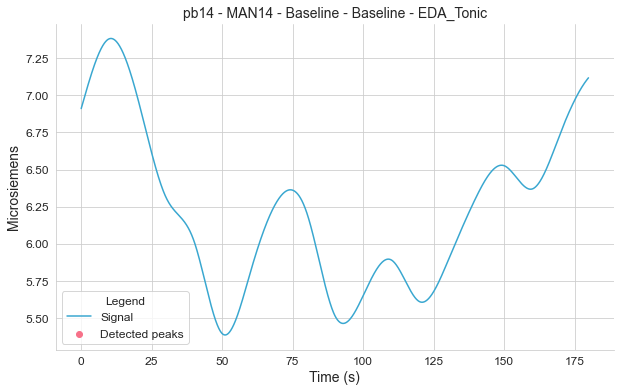

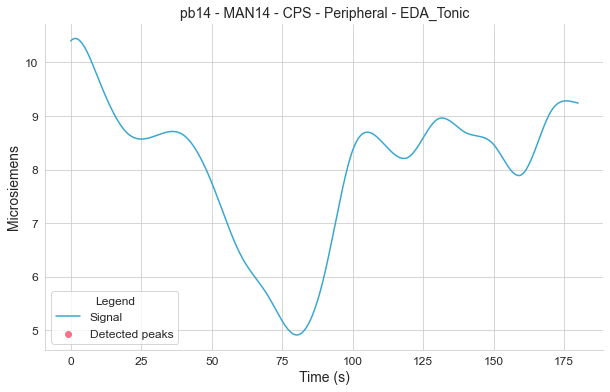

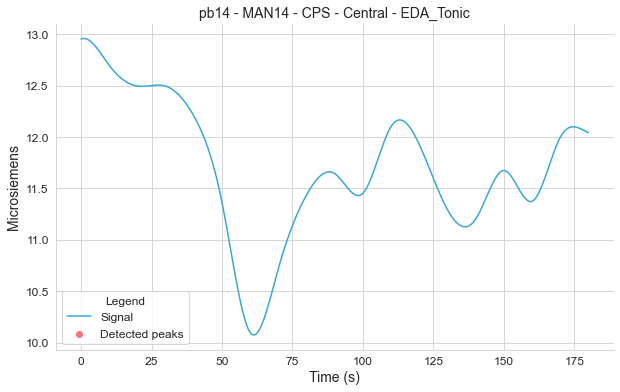

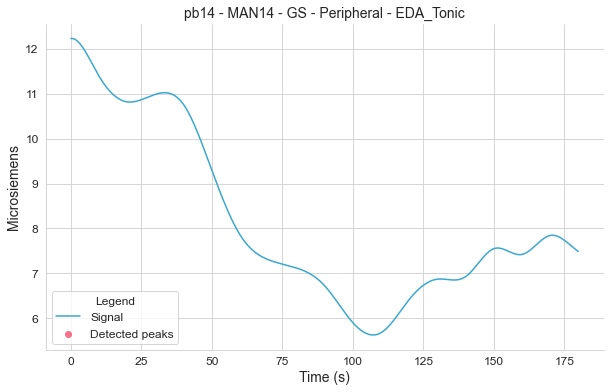

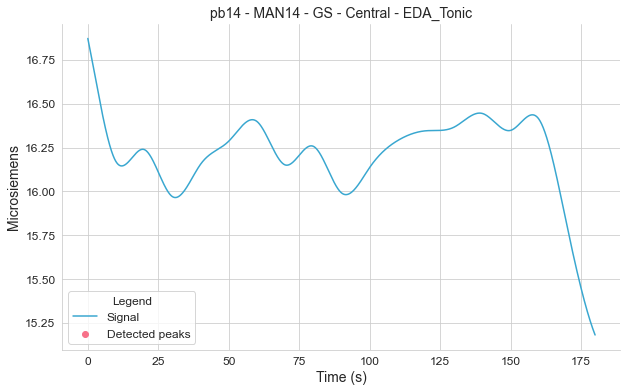

...

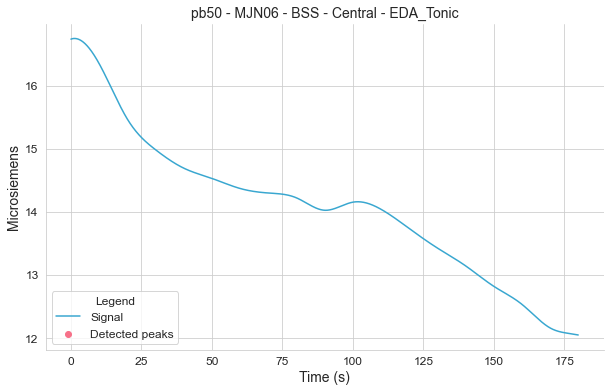

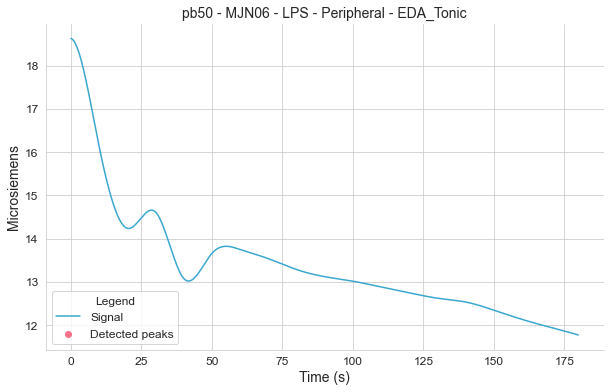

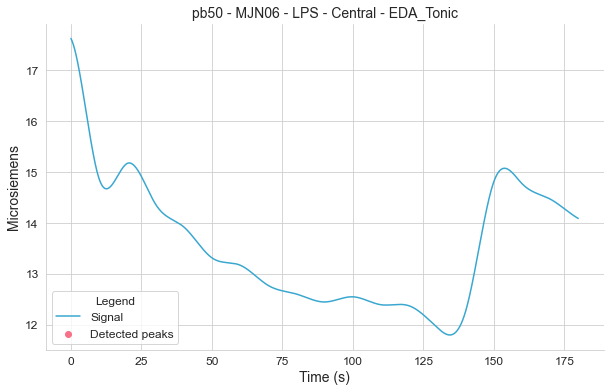

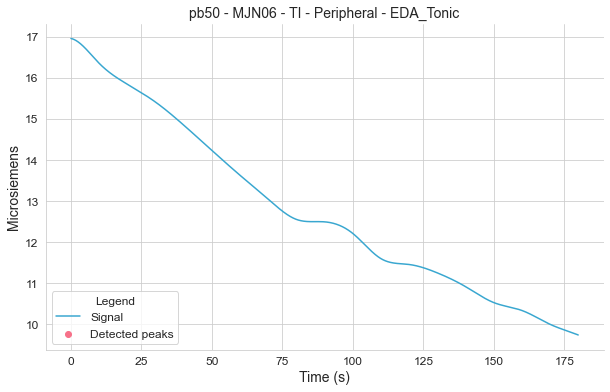

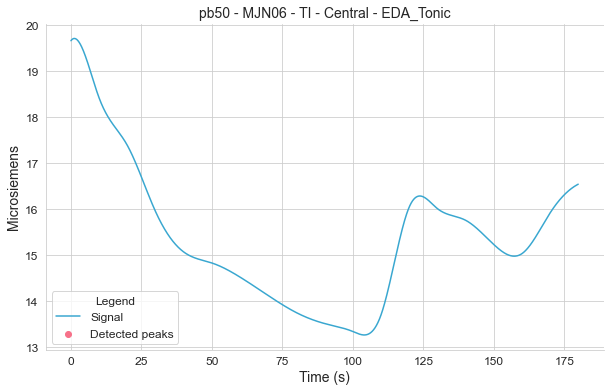

In [11]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Create a directory for saving plots
output_dir = "eda_tonic_peaks_new_approach_003_100"
os.makedirs(output_dir, exist_ok=True)  # Creates the directory if it doesn't already exist

# Enhanced function to detect peaks and mark surrounding points
def mark_peaks(signal, threshold=0.05, peak_length=20):
    """
    Marks peaks in the signal if the absolute difference between neighboring points exceeds a threshold.
    The next `peak_length` points and the same number of preceding points are also marked as part of the peak.

    Parameters:
        signal (list or np.array): The signal to analyze.
        threshold (float): The minimum absolute difference between neighboring points to flag as a peak start.
        peak_length (int): Number of additional datapoints before and after to mark as part of the peak.

    Returns:
        peak_flags (list): A list of the same length as the signal, where 1 marks a peak and 0 marks the rest.
    """
    peak_flags = [0] * len(signal)  # Initialize all points as non-peaks

    for i in range(1, len(signal)):
        diff = abs(signal[i] - signal[i - 1])  # Absolute difference between consecutive points
        if diff > threshold:
            # Mark this point and the next `peak_length` points as part of a peak
            for j in range(max(0, i - peak_length), min(i + peak_length, len(signal))):
                peak_flags[j] = 1

    return peak_flags

# Visualization function
def plot_signal_with_peaks(signal, peak_flags, sampling_rate, title, output_dir):
    """
    Plots the signal with peaks marked in red and non-peak points in blue.

    Parameters:
        signal (list or np.array): The original signal.
        peak_flags (list): A list where 1 marks a peak and 0 marks the rest.
        sampling_rate (int): Sampling rate of the signal.
        title (str): Title of the plot.
        output_dir (str): Directory where plots will be saved.
    """
    # Create time vector
    time_vector = [i / sampling_rate for i in range(len(signal))]

    # Define the plot style
    sns.set_style("whitegrid", {'axes.spines.top': False, 'axes.spines.right': False})
    plt.rcParams['font.family'] = 'Arial'
    plt.rcParams['font.size'] = 12  # Adjust general font size
    plt.rcParams['axes.titlesize'] = 14  # Adjust font size for titles
    plt.rcParams['axes.labelsize'] = 14  # Adjust font size for axes labels

    # Custom color palette for consistency
    custom_palette = sns.color_palette("husl", n_colors=8)
    signal_color = custom_palette[5]
    jump_color = custom_palette[0]  # Rose color from husl palette

    # Plot the signal
    plt.figure(figsize=(10, 6))
    plt.plot(
        time_vector, signal, color=signal_color, label="Signal", linewidth=1.5)  # Plot all in blue initially

    # Highlight peak points in red
    peak_times = [time_vector[i] for i in range(len(peak_flags)) if peak_flags[i] == 1]
    peak_values = [signal[i] for i in range(len(peak_flags)) if peak_flags[i] == 1]
    plt.scatter(peak_times, peak_values, color=jump_color, label="Detected peaks", zorder=5)

    # Add labels and title
    plt.title(title)
    plt.xlabel("Time (s)")
    plt.ylabel("Microsiemens")
    plt.legend(title="Legend", loc="lower left")
    plt.grid(visible=True)

    # Save the plot in the specified output directory
    output_file = os.path.join(output_dir, f"{title.replace(' ', '_')}.png")
    plt.savefig(output_file, dpi=300, bbox_inches="tight")
    plt.show()

# Iterate through the dataframe and process only tonic signals
sampling_rate = 20
threshold = 0.03 # 0.05
peak_length = 100  # Number of additional datapoints before and after to mark as part of the peak

for _, row in eda_decomposed_df.iterrows():
    participant = row['Participant']
    typology = row['Typology']
    position = row['Position']

    # Process only the tonic component
    signal = row['EDA_Tonic']

    # Mark peaks in the signal
    peak_flags = mark_peaks(signal, threshold=threshold, peak_length=peak_length)

    # Plot the signal with marked peaks
    plot_title = f"{participant} - {typology} - {position} - EDA_Tonic"
    plot_signal_with_peaks(
        signal, peak_flags, sampling_rate,
        title=plot_title,
        output_dir=output_dir  # Save plots in the specified folder
    )


### 14. Showcase different Thresholds

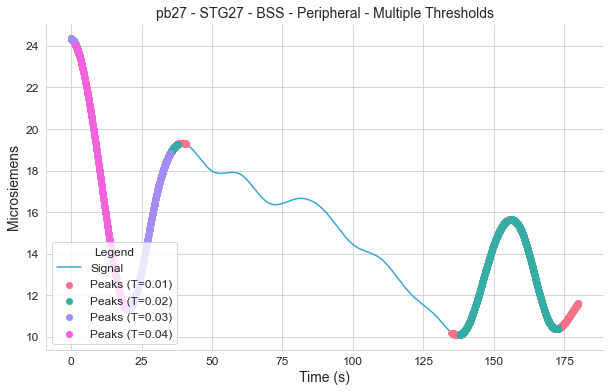

In [21]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Create a directory for saving plots
output_dir = "eda_tonic_peaks_threshold_variation"
os.makedirs(output_dir, exist_ok=True)  # Ensures directory exists

# Custom color palette for consistency
custom_palette = sns.color_palette("husl", n_colors=8)
signal_color = custom_palette[5]  # Base signal color
threshold_colors = {0.01: custom_palette[0],  # Color for threshold 0.01
                    0.02: custom_palette[4],  # Color for threshold 0.01
                    0.03: custom_palette[6],  # Color for threshold 0.03
                    0.04: custom_palette[7]}  # Color for threshold 0.06

# Function to mark peaks
def mark_peaks(signal, threshold=0.05, peak_length=20):
    peak_flags = [0] * len(signal)  # Initialize all points as non-peaks

    for i in range(1, len(signal)):
        diff = abs(signal[i] - signal[i - 1])
        if diff > threshold:
            for j in range(max(0, i - peak_length), min(i + peak_length, len(signal))):
                peak_flags[j] = 1

    return peak_flags

# Function to plot the signal with multiple peak detections
def plot_signal_with_multiple_peaks(signal, peak_flags_dict, sampling_rate, title, output_file):
    time_vector = [i / sampling_rate for i in range(len(signal))]

    sns.set_style("whitegrid", {'axes.spines.top': False, 'axes.spines.right': False})
    plt.rcParams['font.family'] = 'Arial'
    plt.rcParams['font.size'] = 12
    plt.rcParams['axes.titlesize'] = 14
    plt.rcParams['axes.labelsize'] = 14

    plt.figure(figsize=(10, 6))

    # Plot the original signal
    plt.plot(time_vector, signal, color=signal_color, label="Signal", linewidth=1.5)

    # Plot peak markers for each threshold
    for threshold, peak_flags in peak_flags_dict.items():
        peak_times = [time_vector[i] for i in range(len(peak_flags)) if peak_flags[i] == 1]
        peak_values = [signal[i] for i in range(len(peak_flags)) if peak_flags[i] == 1]
        plt.scatter(peak_times, peak_values, color=threshold_colors[threshold], label=f"Peaks (T={threshold})", zorder=5)

    plt.title(title)
    plt.xlabel("Time (s)")
    plt.ylabel("Microsiemens")
    plt.legend(title="Legend", loc="lower left")
    plt.grid(visible=True)

    plt.savefig(output_file, dpi=300, bbox_inches="tight")
    plt.show()

# Filter dataset for pb27 - STG27, BSS, Peripheral
filtered_df = eda_decomposed_df[
    (eda_decomposed_df["Participant"] == "pb27 - STG27") &
    (eda_decomposed_df["Typology"] == "BSS") &
    (eda_decomposed_df["Position"] == "Peripheral")
]

# Ensure subset is not empty
if not filtered_df.empty:
    sampling_rate = 20
    peak_length = 100

    signal = filtered_df.iloc[0]["EDA_Tonic"]  # Extract the tonic component

    # Generate peak flags for different thresholds
    peak_flags_dict = {threshold: mark_peaks(signal, threshold=threshold, peak_length=peak_length)
                       for threshold in [0.01, 0.02, 0.03, 0.04]}

    # Define output filename
    title = "pb27 - STG27 - BSS - Peripheral - Multiple Thresholds"
    output_file = os.path.join(output_dir, "pb27_BSS_Peripheral_Thresholds_Comparison.png")

    # Plot and save
    plot_signal_with_multiple_peaks(signal, peak_flags_dict, sampling_rate, title, output_file)

else:
    print("No matching data found for pb27 - STG27, BSS, Peripheral.")


### 15. Add Gender Labels

In [20]:
demographics_path = "/Users/luciemarme/Desktop/master-thesis/Demographics.csv"
demographics_df = pd.read_csv(demographics_path, sep=';')

demographics_df

,vp,code,gender,Altersgruppe,Gender,LGBTQIA,Bildung,Stadt_Kindheit,Geburtsland,In_Dtl._seit,...,P_unorganisiert_achtlos,P_gelassen_stabil,P_konventionell_unkreativÊ,Kontrolle_Einfluss_Stadt,Verbunden_Berlin,Kenntnis_Versuchsstrecke,Sozial_verbunden,Interesse_Architektur,Psychische_Erkankung,Psychische_Erkankung_Art
0,pb2,FGH59,m,40-49,m,nein,Master,weniger als 5.000 Einwohner*innen,Deutschland,NaN,...,4,5,3,4,2,3,2.0,4.0,nein,NaN
1,pb4,CTU19,m,30-39,m,keine angabe,Master,20.000 - 100.000 Einwohner*innen,Deutschland,NaN,...,1,4,2,5,3,3,NaN,NaN,NaN,NaN
2,pb13,AWD17,m,20-29,m,nein,Bachelor,20.000 - 100.000 Einwohner*innen,Deutschland,NaN,...,1,5,1,3,4,3,4.0,3.0,nein,NaN
3,pb15,OKN28,w,30-39,f,nein,Bachelor,20.000 - 100.000 Einwohner*innen,Israel,NaN,...,4,4,1,2,3,1,NaN,NaN,NaN,NaN
4,pb20,HWG29,m,30-39,m,nicht sicher,Bachelor,mehr als 1 Mio. Einwohner*innen,Deutschland,2.0,...,2,4,1,4,4,3,4.0,3.0,ja,Anpassungsstšrung
5,pb21,AGO11,m,30-39,m,nein,Master,5.000 - 20.000 Einwohner*innen,USA,5.0,...,5,3,1,4,4,2,NaN,NaN,NaN,NaN
6,pb23,GHR04,m,30-39,m,nein,Master,20.000 - 100.000 Einwohner*innen,Deutschland,NaN,...,2,3,2,2,4,3,3.0,1.0,nein,NaN
7,pb24,AGT14,m,20-29,m,nein,Master,mehr als 1 Mio. Einwohner*innen,Ungarn,9.0,...,5,5,2,4,5,4,5.0,4.0,nein,NaN
8,pb26,MMO02,m,30-39,m,nein,Bachelor,weniger als 5.000 Einwohner*innen,Mexiko,1.0,...,3,4,1,1,4,2,4.0,2.0,k.A.,NaN
9,pb27,STG27,m,20-29,m,nein,Bachelor,20.000 - 100.000 Einwohner*innen,Deutschland,NaN,...,2,6,1,4,4,4,2.0,2.0,nein,NaN


In [21]:
import pandas as pd

# Load the demographics CSV file
demographics_path = "/Users/luciemarme/Desktop/master-thesis/Demographics.csv"
demographics_df = pd.read_csv(demographics_path, sep=';')

# Strip extra whitespace from column names and data
demographics_df.columns = demographics_df.columns.str.strip()
demographics_df["vp"] = demographics_df["vp"].astype(str).str.strip()

# Make a copy of the original dataframe to preserve it
eda_with_gender = eda_phasic_adjusted_df.copy()

# Extract the "vp" part from the "Participant" column in the copied dataframe
eda_with_gender["Vp"] = eda_with_gender["Participant"].apply(
    lambda x: x.split('-')[0].strip()
)

# Ensure data types match
eda_with_gender["Vp"] = eda_with_gender["Vp"].astype(str)

# Filter the demographics dataframe to only include relevant 'vp' values
filtered_demographics_df = demographics_df[
    demographics_df["vp"].isin(eda_with_gender["Vp"])
]

# Debugging: Print unique 'vp' values in filtered demographics and copied EDA dataframes
print("Unique 'vp' values in filtered demographics file:", filtered_demographics_df["vp"].unique())
print("Unique 'Vp' values in EDA dataframe copy:", eda_with_gender["Vp"].unique())

# Map the "gender" column from the filtered demographics file to the copied EDA dataframe
eda_with_gender["Gender"] = eda_with_gender["Vp"].map(
    filtered_demographics_df.set_index("vp")["gender"]
)

# Debugging: Print Vp and its mapped gender
# for vp, gender in zip(eda_with_flags_gender["Vp"], eda_with_flags_gender["Gender"]):
#   print(f"Participant ID: {vp}, Mapped Gender: {gender}")

# Identify rows where gender mapping failed (NaN entries) in the copied dataframe
failed_mapping = eda_with_gender[eda_with_gender["Gender"].isna()]
if not failed_mapping.empty:
    print("Rows with failed gender mapping:")
    print(failed_mapping[["Participant", "Vp"]])

# Final DataFrame
eda_with_gender


Unique 'vp' values in filtered demographics file: ['pb15' 'pb20' 'pb21' 'pb23' 'pb24' 'pb26' 'pb27' 'pb28' 'pb29' 'pb30'
 'pb31' 'pb32' 'pb33' 'pb35' 'pb36' 'pb37' 'pb14' 'pb16' 'pb17' 'pb18'
 'pb19' 'pb22' 'pb38' 'pb40' 'pb41' 'pb42' 'pb43' 'pb44' 'pb45' 'pb46'
 'pb47' 'pb48' 'pb49' 'pb50']
Unique 'Vp' values in EDA dataframe copy: ['pb14' 'pb15' 'pb16' 'pb17' 'pb18' 'pb19' 'pb20' 'pb21' 'pb22' 'pb23'
 'pb24' 'pb26' 'pb27' 'pb28' 'pb29' 'pb30' 'pb31' 'pb32' 'pb33' 'pb35'
 'pb36' 'pb37' 'pb38' 'pb39' 'pb40' 'pb41' 'pb42' 'pb43' 'pb44' 'pb45'
 'pb46' 'pb47' 'pb48' 'pb49' 'pb50']
Rows with failed gender mapping:
      Participant    Vp
231  pb39 - IKE31  pb39
232  pb39 - IKE31  pb39
233  pb39 - IKE31  pb39
234  pb39 - IKE31  pb39
235  pb39 - IKE31  pb39
236  pb39 - IKE31  pb39
237  pb39 - IKE31  pb39
238  pb39 - IKE31  pb39
239  pb39 - IKE31  pb39
240  pb39 - IKE31  pb39
241  pb39 - IKE31  pb39


,Participant,Typology,Position,EDA_signal,EDA_downsampled,EDA_Clean,EDA_Tonic,EDA_Phasic,Incomplete_Flag,Saturation_Flag,...,saturation_mask,incomplete_mask,peak_mask,summary_mask,valid_tonic_mean,EDA_Tonic_Adjusted,EDA_Phasic_Adjusted,EDA_Phasic_Adjusted_Normalized,Vp,Gender
0,pb14 - MAN14,Baseline,Baseline,"[6.91, 6.91, 6.91, 6.91, 6.91, 6.91, 6.91, 6.9...","[6.91, 6.91, 6.93, 6.93, 6.96, 6.98, 7.01, 7.0...","[6.942727306657284, 6.9481153564665625, 6.9555...","[6.9103, 6.9136, 6.9169, 6.9202, 6.9236, 6.926...","[0.0, 0.0, 0.0123, 0.0318, 0.0494, 0.0653, 0.0...",0,0,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",6.220840,"[6.9103, 6.9136, 6.9169, 6.9202, 6.9236, 6.926...","[0.0, 0.0, 0.0123, 0.0318, 0.0494, 0.0653, 0.0...",0.287340,pb14,w
1,pb14 - MAN14,CPS,Peripheral,"[10.5, 10.5, 10.47, 10.47, 10.47, 10.5, 10.47,...","[10.5, 10.47, 10.47, 10.45, 10.45, 10.45, 10.4...","[10.471718316448104, 10.468895858328672, 10.46...","[10.4018, 10.4047, 10.4076, 10.4103, 10.413, 1...","[0.0, 0.0, 0.1053, 0.082, 0.0608, 0.0414, 0.02...",0,0,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",8.025687,"[10.4018, 10.4047, 10.4076, 10.4103, 10.413, 1...","[0.0, 0.0, 0.1053, 0.082, 0.0608, 0.0414, 0.02...",0.367101,pb14,w
2,pb14 - MAN14,CPS,Central,"[12.99, 12.99, 12.99, 12.99, 12.99, 12.99, 12....","[12.99, 13.01, 13.01, 13.01, 13.04, 13.04, 13....","[13.010079271932252, 13.01190041645853, 13.014...","[12.9531, 12.9537, 12.9543, 12.9548, 12.9553, ...","[0.0, 0.0, 0.1491, 0.1302, 0.1129, 0.097, 0.08...",0,0,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",11.705466,"[12.9531, 12.9537, 12.9543, 12.9548, 12.9553, ...","[0.0, 0.0, 0.1491, 0.1302, 0.1129, 0.097, 0.08...",0.730078,pb14,w
3,pb14 - MAN14,GS,Peripheral,"[12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12....","[12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12....","[12.305868718284792, 12.30952846007988, 12.315...","[12.2287, 12.2291, 12.2294, 12.2296, 12.2298, ...","[0.0, 0.0, 0.0444, 0.0756, 0.1038, 0.1293, 0.1...",0,0,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",8.154346,"[12.2287, 12.2291, 12.2294, 12.2296, 12.2298, ...","[0.0, 0.0, 0.0444, 0.0756, 0.1038, 0.1293, 0.1...",0.303525,pb14,w
4,pb14 - MAN14,GS,Central,"[16.94, 16.94, 16.92, 16.94, 16.92, 16.94, 16....","[16.94, 16.92, 16.92, 16.92, 16.89, 16.89, 16....","[16.920356028977555, 16.91841956052293, 16.915...","[16.8719, 16.8679, 16.8639, 16.8599, 16.8559, ...","[0.0, 0.0, 0.0407, 0.0438, 0.0465, 0.0489, 0.0...",0,0,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",16.208750,"[16.8719, 16.8679, 16.8639, 16.8599, 16.8559, ...","[0.0, 0.0, 0.0407, 0.0438, 0.0465, 0.0489, 0.0...",0.368309,pb14,w
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331,pb50 - MJN06,BSS,Central,"[16.7, 16.7, 16.7, 16.72, 16.7, 16.7, 16.7, 16...","[16.7, 16.72, 16.75, 16.75, 16.75, 16.75, 16.7...","[16.723762063286628, 16.725428095477383, 16.72...","[16.7413, 16.7421, 16.7429, 16.7437, 16.7444, ...","[0.0, 0.0, -0.0197, -0.0159, -0.0124, -0.0092,...",0,0,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0,

In [106]:
print(eda_with_gender['Participant'].value_counts())


pb36 - DSM18    11
pb50 - MJN06    11
pb38 - MUH08    11
pb37 - CCN18    11
pb27 - STG27    11
pb39 - IKE31    11
pb21 - AGO11    11
pb40 - IMN29    11
pb17 - AEW02    11
pb32 - HNG26    11
pb14 - MAN14    11
pb22 - GRR10    11
pb15 - ONK28    11
pb24 - AGT14    11
pb44 - AWD10    11
pb26 - MMO02    11
pb18 - WJG24    11
pb31 - MJN12    11
pb41 - NGA35    11
pb35 - BRE26    11
pb48 - AWG36    11
pb49 - MPD06    11
pb47 - FMT17    10
pb30 - CAN61    10
pb23 - GHR03    10
pb20 - HWG29    10
pb19 - BLN10     9
pb33 - AHN27     9
pb29 - GMG06     8
pb46 - GAR28     7
pb42 - MCG24     7
pb28 - EFN19     6
pb16 - KKN25     4
pb43 - IVZ24     2
pb45 - CAM29     2
Name: Participant, dtype: int64


In [22]:
print(len(eda_with_gender))

336


### 16. Calculate Metrics

#### 16.1 Mean of Tonic Component for the adjusted signal

In [23]:
# Function to compute the mean of the adjusted tonic signal
def compute_tonic_mean(eda_tonic_adjusted):
    """
    Computes the mean of the adjusted tonic signal.

    Parameters:
        eda_tonic_adjusted (list): The adjusted tonic signal with flagged values removed.

    Returns:
        float: Mean value of the adjusted tonic signal.
    """
    if not isinstance(eda_tonic_adjusted, list) or len(eda_tonic_adjusted) == 0:
        return np.nan  # Return NaN if signal is missing or empty

    # Compute mean of valid tonic values
    tonic_mean_metric = np.mean(eda_tonic_adjusted)

    return tonic_mean_metric

# Apply function to calculate the final tonic metric
eda_with_gender['Tonic_Mean_Metric'] = eda_with_gender['EDA_Tonic_Adjusted'].apply(compute_tonic_mean)


In [24]:
# Display first few rows for verification
print(eda_with_gender[['Participant', 'Gender', 'Tonic_Mean_Metric']].head())


    Participant Gender  Tonic_Mean_Metric
0  pb14 - MAN14      w           6.220840
1  pb14 - MAN14      w           8.025687
2  pb14 - MAN14      w          11.705466
3  pb14 - MAN14      w           8.154346
4  pb14 - MAN14      w          16.208750


#### 16.2 AUC and ns-SCRs for adjusted phasic component

In [25]:
## Version: Per Seconds
import numpy as np
import pandas as pd
from scipy.signal import find_peaks

# Make a copy of the dataframe for storing final adjusted metrics
eda_final_metrics_df = eda_with_gender.copy()

def compute_metrics_per_second(original_phasic_signal, summary_mask, sampling_rate=20):
    """
    Computes:
    - AUC (Area Under Curve) per second.
    - ns-SCR (non-specific SCR count) per second.

    Parameters:
        original_phasic_signal (list): The original phasic signal.
        summary_mask (list): Mask where 0 = valid, 1 = invalid.
        sampling_rate (int): The number of datapoints per second.

    Returns:
        tuple: (AUC per second, ns-SCR per second)
    """
    if not isinstance(original_phasic_signal, list) or not isinstance(summary_mask, list):
        return np.nan, np.nan  # Return NaN if data is missing

    # Convert to NumPy arrays for efficiency
    phasic_signal = np.array(original_phasic_signal)
    summary_mask = np.array(summary_mask)

    # Compute total duration in seconds
    num_seconds = len(phasic_signal) / sampling_rate  # Total number of seconds

    if num_seconds == 0:
        return np.nan, np.nan  # Avoid division by zero

    # Step 1: Identify peaks in the full phasic signal
    ns_scr_threshold = 0.02  # Threshold for detecting SCR peaks
    peak_indices, _ = find_peaks(phasic_signal, height=ns_scr_threshold)

    # Step 2: Validate peaks based on the summary mask
    valid_peak_indices = [idx for idx in peak_indices if summary_mask[idx] == 0]

    # Step 3: Replace masked values (summary_mask == 1) with 0.0 instead of removing them
    modified_phasic_signal = np.where(summary_mask == 1, 0.0, phasic_signal)

    # Step 4: Compute total AUC using the trapezoidal rule
    total_auc = np.trapz(np.abs(modified_phasic_signal), dx=1)

    # Normalize per second
    auc_per_second = total_auc / num_seconds if num_seconds > 0 else 0
    ns_scr_per_second = len(valid_peak_indices) / num_seconds if num_seconds > 0 else 0

    return auc_per_second, ns_scr_per_second

# Apply calculations and store in new columns
eda_final_metrics_df[["AUC_per_second", "ns-SCR_per_second"]] = eda_final_metrics_df.apply(
    lambda row: compute_metrics_per_second(row["EDA_Phasic"], row["summary_mask"]), axis=1, result_type="expand"
)

# Display first few rows to verify results
print(eda_final_metrics_df[["Participant", "AUC_per_second", "ns-SCR_per_second"]].head())


    Participant  AUC_per_second  ns-SCR_per_second
0  pb14 - MAN14        5.746343           0.216667
1  pb14 - MAN14        7.427975           0.161111
2  pb14 - MAN14       14.612302           0.238889
3  pb14 - MAN14        6.070189           0.150000
4  pb14 - MAN14        7.362662           0.233333


In [26]:
eda_final_metrics_df

,Participant,Typology,Position,EDA_signal,EDA_downsampled,EDA_Clean,EDA_Tonic,EDA_Phasic,Incomplete_Flag,Saturation_Flag,...,summary_mask,valid_tonic_mean,EDA_Tonic_Adjusted,EDA_Phasic_Adjusted,EDA_Phasic_Adjusted_Normalized,Vp,Gender,Tonic_Mean_Metric,AUC_per_second,ns-SCR_per_second
0,pb14 - MAN14,Baseline,Baseline,"[6.91, 6.91, 6.91, 6.91, 6.91, 6.91, 6.91, 6.9...","[6.91, 6.91, 6.93, 6.93, 6.96, 6.98, 7.01, 7.0...","[6.942727306657284, 6.9481153564665625, 6.9555...","[6.9103, 6.9136, 6.9169, 6.9202, 6.9236, 6.926...","[0.0, 0.0, 0.0123, 0.0318, 0.0494, 0.0653, 0.0...",0,0,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",6.220840,"[6.9103, 6.9136, 6.9169, 6.9202, 6.9236, 6.926...","[0.0, 0.0, 0.0123, 0.0318, 0.0494, 0.0653, 0.0...",0.287340,pb14,w,6.220840,5.746343,0.216667
1,pb14 - MAN14,CPS,Peripheral,"[10.5, 10.5, 10.47, 10.47, 10.47, 10.5, 10.47,...","[10.5, 10.47, 10.47, 10.45, 10.45, 10.45, 10.4...","[10.471718316448104, 10.468895858328672, 10.46...","[10.4018, 10.4047, 10.4076, 10.4103, 10.413, 1...","[0.0, 0.0, 0.1053, 0.082, 0.0608, 0.0414, 0.02...",0,0,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",8.025687,"[10.4018, 10.4047, 10.4076, 10.4103, 10.413, 1...","[0.0, 0.0, 0.1053, 0.082, 0.0608, 0.0414, 0.02...",0.367101,pb14,w,8.025687,7.427975,0.161111
2,pb14 - MAN14,CPS,Central,"[12.99, 12.99, 12.99, 12.99, 12.99, 12.99, 12....","[12.99, 13.01, 13.01, 13.01, 13.04, 13.04, 13....","[13.010079271932252, 13.01190041645853, 13.014...","[12.9531, 12.9537, 12.9543, 12.9548, 12.9553, ...","[0.0, 0.0, 0.1491, 0.1302, 0.1129, 0.097, 0.08...",0,0,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",11.705466,"[12.9531, 12.9537, 12.9543, 12.9548, 12.9553, ...","[0.0, 0.0, 0.1491, 0.1302, 0.1129, 0.097, 0.08...",0.730078,pb14,w,11.705466,14.612302,0.238889
3,pb14 - MAN14,GS,Peripheral,"[12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12....","[12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12....","[12.305868718284792, 12.30952846007988, 12.315...","[12.2287, 12.2291, 12.2294, 12.2296, 12.2298, ...","[0.0, 0.0, 0.0444, 0.0756, 0.1038, 0.1293, 0.1...",0,0,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",8.154346,"[12.2287, 12.2291, 12.2294, 12.2296, 12.2298, ...","[0.0, 0.0, 0.0444, 0.0756, 0.1038, 0.1293, 0.1...",0.303525,pb14,w,8.154346,6.070189,0.150000
4,pb14 - MAN14,GS,Central,"[16.94, 16.94, 16.92, 16.94, 16.92, 16.94, 16....","[16.94, 16.92, 16.92, 16.92, 16.89, 16.89, 16....","[16.920356028977555, 16.91841956052293, 16.915...","[16.8719, 16.8679, 16.8639, 16.8599, 16.8559, ...","[0.0, 0.0, 0.0407, 0.0438, 0.0465, 0.0489, 0.0...",0,0,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",16.208750,"[16.8719, 16.8679, 16.8639, 16.8599, 16.8559, ...","[0.0, 0.0, 0.0407, 0.0438, 0.0465, 0.0489, 0.0...",0.368309,pb14,w,16.208750,7.362662,0.233333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331,pb50 - MJN06,BSS,Central,"[16.7, 16.7, 16.7, 16.72, 16.7, 16.7, 16.7, 16...","[16.7, 16.72, 16.75, 16.75, 16.75, 16.75, 16.7...","[16.723762063286628, 16.725428095477383, 16.72...","[16.7413, 16.7421, 16.7429, 16.7437, 16.7444, ...","[0.0, 0.0, -0.0197, -0.0159, -0.0124, -0.0092,...",0,0,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",14.077939,"[16.7413, 16.7421, 16.7429, 16.7437, 16.7444, ...","[0.0, 0.0, -0.0197, -0.0159, -0.0124, -0.0092,...",0.107593,pb50,w,14.077939,2.152576,0.133333
332,pb50 - MJN06,LPS,Peripheral,"[18.63, 18.63, 18.63, 18.63, 18.63, 18.63, 18....","[18.63, 18.63, 18.65, 18.68, 18.7, 18.7, 18.7,...","[18.65619143728909, 18.65807922638178, 18.6605...","[18.6259, 18.625, 18.6238, 18.6225, 18.621, 18...","[0.0, 0.0, 0.0204, 0.0321, 0.0426, 0.0521, 0.0...",0,0,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",13.379157,"[18.6259, 18.625, 18.6238, 18.6225, 18.621, 18...","[0.0, 0.0, 0.0204, 0.0321, 0.0426, 0.0521, 0.0...",0.223707,pb50,w,13.379157,4.474112,0.161111
333,pb50 - MJN06,LPS,Central,"[17.82, 17.82, 17.82, 17.82, 17.82, 17.82, 17....

In [27]:
# Save to a pickle file
eda_final_metrics_df.to_pickle("eda_final_metrics.pkl")

In [38]:
eda_final_metrics_df.to_csv("eda_final_metrics_06-03-25.csv", index=False)


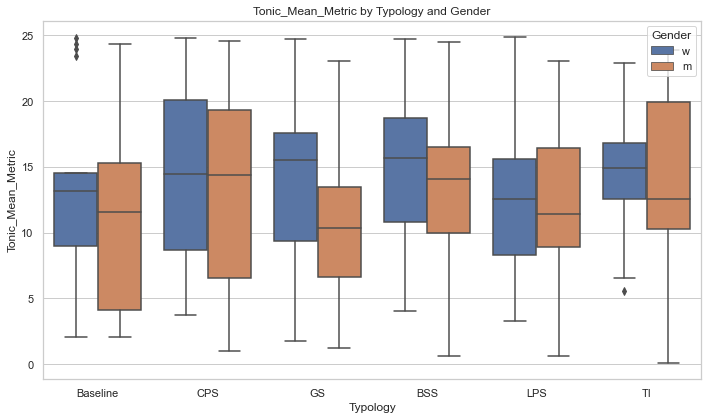

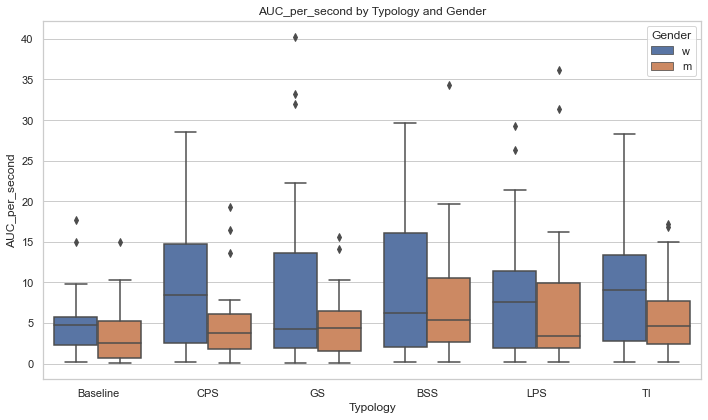

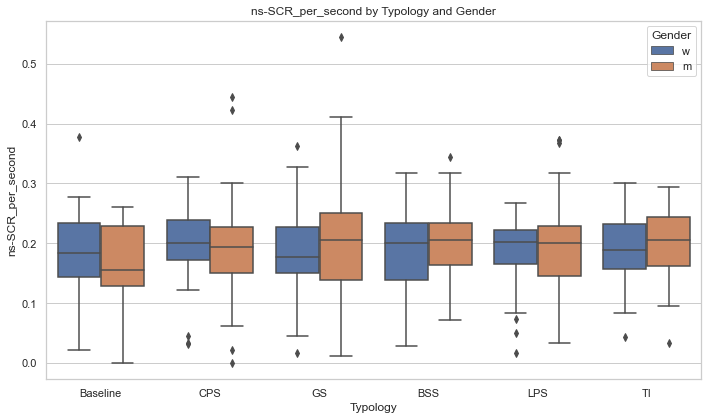

In [2]:
## Plot

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your pickle file into a DataFrame
df = pd.read_pickle('eda_final_metrics.pkl')  # replace with your actual file path

# Set the plot style
sns.set(style="whitegrid")

# List of metrics to plot
metrics = ['Tonic_Mean_Metric', 'AUC_per_second', 'ns-SCR_per_second']

# Create one plot per metric
for metric in metrics:
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df, x='Typology', y=metric, hue='Gender')
    plt.title(f'{metric} by Typology and Gender')
    plt.xlabel('Typology')
    plt.ylabel(metric)
    plt.legend(title='Gender', loc='upper right')
    plt.tight_layout()
    plt.show()


In [4]:
# Load your pickle file into a DataFrame
eda_final_metrics_df = pd.read_pickle('eda_final_metrics.pkl')  # replace with your actual file path

In [5]:
eda_final_metrics_df

,Participant,Typology,Position,EDA_signal,EDA_downsampled,EDA_Clean,EDA_Tonic,EDA_Phasic,Incomplete_Flag,Saturation_Flag,...,summary_mask,valid_tonic_mean,EDA_Tonic_Adjusted,EDA_Phasic_Adjusted,EDA_Phasic_Adjusted_Normalized,Vp,Gender,Tonic_Mean_Metric,AUC_per_second,ns-SCR_per_second
0,pb14 - MAN14,Baseline,Baseline,"[6.91, 6.91, 6.91, 6.91, 6.91, 6.91, 6.91, 6.9...","[6.91, 6.91, 6.93, 6.93, 6.96, 6.98, 7.01, 7.0...","[6.942727306657284, 6.9481153564665625, 6.9555...","[6.9103, 6.9136, 6.9169, 6.9202, 6.9236, 6.926...","[0.0, 0.0, 0.0123, 0.0318, 0.0494, 0.0653, 0.0...",0,0,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",6.220840,"[6.9103, 6.9136, 6.9169, 6.9202, 6.9236, 6.926...","[0.0, 0.0, 0.0123, 0.0318, 0.0494, 0.0653, 0.0...",0.287340,pb14,w,6.220840,5.746343,0.216667
1,pb14 - MAN14,CPS,Peripheral,"[10.5, 10.5, 10.47, 10.47, 10.47, 10.5, 10.47,...","[10.5, 10.47, 10.47, 10.45, 10.45, 10.45, 10.4...","[10.471718316448104, 10.468895858328672, 10.46...","[10.4018, 10.4047, 10.4076, 10.4103, 10.413, 1...","[0.0, 0.0, 0.1053, 0.082, 0.0608, 0.0414, 0.02...",0,0,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",8.025687,"[10.4018, 10.4047, 10.4076, 10.4103, 10.413, 1...","[0.0, 0.0, 0.1053, 0.082, 0.0608, 0.0414, 0.02...",0.367101,pb14,w,8.025687,7.427975,0.161111
2,pb14 - MAN14,CPS,Central,"[12.99, 12.99, 12.99, 12.99, 12.99, 12.99, 12....","[12.99, 13.01, 13.01, 13.01, 13.04, 13.04, 13....","[13.010079271932252, 13.01190041645853, 13.014...","[12.9531, 12.9537, 12.9543, 12.9548, 12.9553, ...","[0.0, 0.0, 0.1491, 0.1302, 0.1129, 0.097, 0.08...",0,0,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",11.705466,"[12.9531, 12.9537, 12.9543, 12.9548, 12.9553, ...","[0.0, 0.0, 0.1491, 0.1302, 0.1129, 0.097, 0.08...",0.730078,pb14,w,11.705466,14.612302,0.238889
3,pb14 - MAN14,GS,Peripheral,"[12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12....","[12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12....","[12.305868718284792, 12.30952846007988, 12.315...","[12.2287, 12.2291, 12.2294, 12.2296, 12.2298, ...","[0.0, 0.0, 0.0444, 0.0756, 0.1038, 0.1293, 0.1...",0,0,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",8.154346,"[12.2287, 12.2291, 12.2294, 12.2296, 12.2298, ...","[0.0, 0.0, 0.0444, 0.0756, 0.1038, 0.1293, 0.1...",0.303525,pb14,w,8.154346,6.070189,0.150000
4,pb14 - MAN14,GS,Central,"[16.94, 16.94, 16.92, 16.94, 16.92, 16.94, 16....","[16.94, 16.92, 16.92, 16.92, 16.89, 16.89, 16....","[16.920356028977555, 16.91841956052293, 16.915...","[16.8719, 16.8679, 16.8639, 16.8599, 16.8559, ...","[0.0, 0.0, 0.0407, 0.0438, 0.0465, 0.0489, 0.0...",0,0,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",16.208750,"[16.8719, 16.8679, 16.8639, 16.8599, 16.8559, ...","[0.0, 0.0, 0.0407, 0.0438, 0.0465, 0.0489, 0.0...",0.368309,pb14,w,16.208750,7.362662,0.233333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331,pb50 - MJN06,BSS,Central,"[16.7, 16.7, 16.7, 16.72, 16.7, 16.7, 16.7, 16...","[16.7, 16.72, 16.75, 16.75, 16.75, 16.75, 16.7...","[16.723762063286628, 16.725428095477383, 16.72...","[16.7413, 16.7421, 16.7429, 16.7437, 16.7444, ...","[0.0, 0.0, -0.0197, -0.0159, -0.0124, -0.0092,...",0,0,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",14.077939,"[16.7413, 16.7421, 16.7429, 16.7437, 16.7444, ...","[0.0, 0.0, -0.0197, -0.0159, -0.0124, -0.0092,...",0.107593,pb50,w,14.077939,2.152576,0.133333
332,pb50 - MJN06,LPS,Peripheral,"[18.63, 18.63, 18.63, 18.63, 18.63, 18.63, 18....","[18.63, 18.63, 18.65, 18.68, 18.7, 18.7, 18.7,...","[18.65619143728909, 18.65807922638178, 18.6605...","[18.6259, 18.625, 18.6238, 18.6225, 18.621, 18...","[0.0, 0.0, 0.0204, 0.0321, 0.0426, 0.0521, 0.0...",0,0,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",13.379157,"[18.6259, 18.625, 18.6238, 18.6225, 18.621, 18...","[0.0, 0.0, 0.0204, 0.0321, 0.0426, 0.0521, 0.0...",0.223707,pb50,w,13.379157,4.474112,0.161111
333,pb50 - MJN06,LPS,Central,"[17.82, 17.82, 17.82, 17.82, 17.82, 17.82, 17....

#### 16.3 Test calculated metrics for one participant

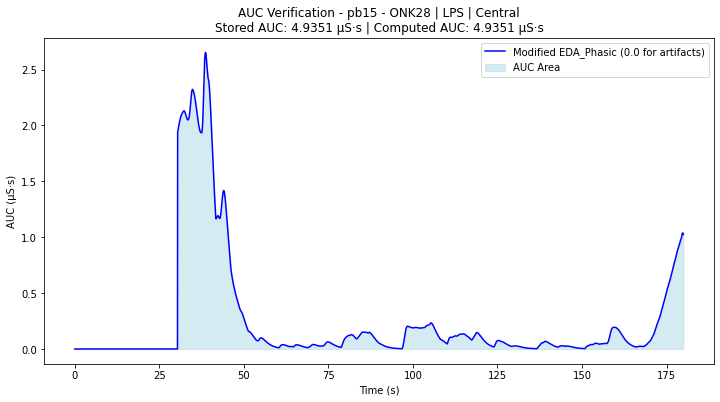

Stored AUC (μS·s): 4.9351
Computed AUC per second (Trapezoidal Rule) (μS·s): 4.9351
Difference: 0.000000


In [29]:
## Version: per seconds
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define the participant ID, typology, and position
participant_id = "pb15 - ONK28"
typology = "LPS"
position = "Central"

# Sampling rate (20 Hz = 20 samples per second)
sampling_rate = 20

# Filter the dataframe for the specific participant, typology, and position
participant_data = eda_final_metrics_df[
    (eda_final_metrics_df["Participant"] == participant_id) &
    (eda_final_metrics_df["Typology"] == typology) &
    (eda_final_metrics_df["Position"] == position)
]

if not participant_data.empty:
    # Extract original phasic signal and summary mask
    phasic_signal = participant_data["EDA_Phasic"].iloc[0]  # Original phasic signal
    summary_mask = participant_data["summary_mask"].iloc[0]  # Mask (1 = artifact, 0 = valid)

    # Ensure data is in list format
    if isinstance(phasic_signal, list) and isinstance(summary_mask, list):
        phasic_signal = np.array(phasic_signal)
        summary_mask = np.array(summary_mask)

        # Replace flagged values (summary_mask == 1) with 0.0
        modified_phasic_signal = np.where(summary_mask == 1, 0.0, phasic_signal)

        # Compute total AUC (Area Under Curve) using the trapezoidal rule
        total_auc = np.trapz(np.abs(modified_phasic_signal), dx=1)

        # Compute total duration in seconds
        num_seconds = len(modified_phasic_signal) / sampling_rate

        # Normalize AUC per second
        computed_auc_per_second = total_auc / num_seconds if num_seconds > 0 else 0

        # Extract stored AUC per second for comparison
        stored_auc_per_second = participant_data["AUC_per_second"].iloc[0]

        # Generate time axis in seconds
        time_axis = np.arange(0, num_seconds, 1 / sampling_rate)  # Create a time array from 0 to duration

        # Plot modified phasic EDA with AUC Highlighted
        plt.figure(figsize=(12, 6))

        # Plot modified phasic EDA signal
        plt.plot(time_axis, modified_phasic_signal, label="Modified EDA_Phasic (0.0 for artifacts)", color="blue")

        # Fill the area under the curve
        plt.fill_between(time_axis, modified_phasic_signal, color="lightblue", alpha=0.5, label="AUC Area")

        plt.xlabel("Time (s)")  # Updated x-axis unit
        plt.ylabel("AUC (μS·s)")  # Updated y-axis unit
        plt.title(f"AUC Verification - {participant_id} | {typology} | {position}\n"
                  f"Stored AUC: {stored_auc_per_second:.4f} μS·s | Computed AUC: {computed_auc_per_second:.4f} μS·s")
        plt.legend()
        plt.show()

        # Print comparison
        print(f"Stored AUC (μS·s): {stored_auc_per_second:.4f}")
        print(f"Computed AUC per second (Trapezoidal Rule) (μS·s): {computed_auc_per_second:.4f}")
        print(f"Difference: {abs(stored_auc_per_second - computed_auc_per_second):.6f}")

    else:
        print(f"Phasic signal or mask for {participant_id} is not in the correct format.")
else:
    print(f"No data found for participant {participant_id} at {typology} - {position}.")


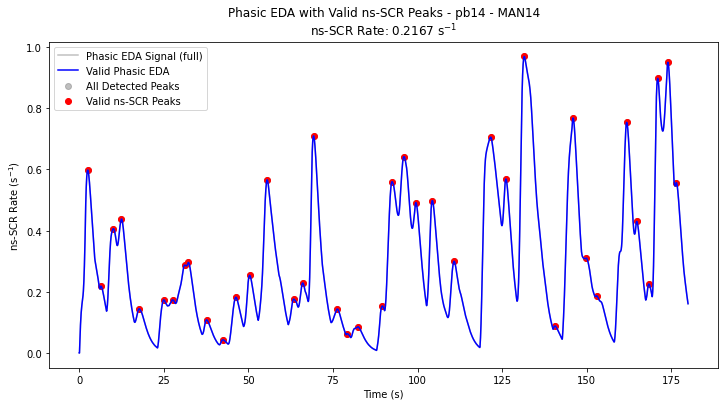

Computed ns-SCR Rate (s⁻¹): 0.2167


In [30]:
## Version: per seconds

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Define the participant ID
participant_id = "pb14 - MAN14"

# Sampling rate (20 Hz = 20 samples per second)
sampling_rate = 20

# Filter the dataframe for the specific participant
participant_data = eda_final_metrics_df[eda_final_metrics_df["Participant"] == participant_id]

if not participant_data.empty:
    # Extract phasic signal and summary mask
    phasic_signal = participant_data["EDA_Phasic"].iloc[0]  # Assuming stored as a list
    summary_mask = participant_data["summary_mask"].iloc[0]  # Assuming stored as a list

    # Ensure data is in list format
    if isinstance(phasic_signal, list) and isinstance(summary_mask, list):
        phasic_signal = np.array(phasic_signal)
        summary_mask = np.array(summary_mask)

        # Compute total duration in seconds
        num_seconds = len(phasic_signal) / sampling_rate

        # Step 1: Detect all peaks in the phasic signal
        peak_indices, _ = find_peaks(phasic_signal, height=0.02)  # Threshold can be adjusted

        # Step 2: Check which detected peaks are in valid regions
        valid_peak_indices = [idx for idx in peak_indices if summary_mask[idx] == 0]

        # Compute ns-SCR per second (valid peaks per second)
        ns_scr_per_second = len(valid_peak_indices) / num_seconds if num_seconds > 0 else 0

        # Extract only valid (non-masked) phasic values
        valid_indices = np.where(summary_mask == 0)[0]
        valid_phasic_values = phasic_signal[valid_indices]

        # Generate time axis in seconds
        time_axis = np.arange(0, num_seconds, 1 / sampling_rate)  # Convert to seconds

        # Plot
        plt.figure(figsize=(12, 6))

        # Plot the full phasic signal (gray for context)
        plt.plot(time_axis, phasic_signal, label="Phasic EDA Signal (full)", color="gray", alpha=0.5)

        # Plot only valid signal points (blue)
        plt.plot(time_axis[valid_indices], valid_phasic_values, label="Valid Phasic EDA", color="blue")

        # Mark all detected peaks in gray
        plt.scatter(time_axis[peak_indices], phasic_signal[peak_indices], 
                    color="gray", marker="o", label="All Detected Peaks", alpha=0.5)

        # Mark valid peaks in red
        plt.scatter(time_axis[valid_peak_indices], phasic_signal[valid_peak_indices], 
                    color="red", marker="o", label="Valid ns-SCR Peaks")

        plt.xlabel("Time (s)")  # Updated x-axis unit
        plt.ylabel(r"ns-SCR Rate (s$^{-1}$)")  # Updated y-axis with LaTeX superscript
        plt.title(f"Phasic EDA with Valid ns-SCR Peaks - {participant_id}\n"
                  f"ns-SCR Rate: {ns_scr_per_second:.4f} s$^{{-1}}$")
        plt.legend()
        plt.show()

        # Print computed ns-SCR rate
        print(f"Computed ns-SCR Rate (s⁻¹): {ns_scr_per_second:.4f}")

    else:
        print(f"Phasic signal or mask for {participant_id} is not in the correct format.")
else:
    print(f"No data found for participant {participant_id}.")


In [31]:
## Version: Per Second

import os
import matplotlib.pyplot as plt
import seaborn as sns

# Create output directory for per-second plots
output_dir_per_second = "mean_metric_plots_per_second"
os.makedirs(output_dir_per_second, exist_ok=True)

# Set seaborn style and aesthetics
sns.set_style("whitegrid", {'axes.spines.top': False, 'axes.spines.right': False})
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 14

# Define the Husl color palette for typologies
husl_colors = sns.color_palette("husl", 6)

# Define the desired typology order
typology_order = ["Baseline", "GS", "CPS", "LPS", "BSS", "TI"]

# Metrics to plot (including Tonic_Mean_Metric)
metrics_to_plot = ["Tonic_Mean_Metric", "AUC_per_second", "ns-SCR_per_second"]

# --- Plot per-second metrics & Tonic Mean Metric ---
for metric in metrics_to_plot:
    plt.figure(figsize=(10, 6))

    # Compute mean for each typology and ensure ordering
    typology_means = eda_final_metrics_df.groupby("Typology")[metric].mean().reindex(typology_order)

    # Plot the means with the Husl colors
    sns.barplot(x=typology_means.index, y=typology_means.values, palette=husl_colors)

    # Customize y-axis label with correct scientific notation
    if metric == "AUC_per_second":
        ylabel = "Mean AUC (μS·s)"
    elif metric == "ns-SCR_per_second":
        ylabel = r"Mean ns-SCR Rate (s$^{-1}$)"
    else:
        ylabel = "Mean Value"

    # Customize plot
    plt.title(f"Mean {metric} Across Typologies", fontsize=14, fontweight="bold")
    plt.xlabel("Urban Typologies", fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    plt.grid(axis="y", linestyle="--", alpha=0.6)

    # Save the plot
    plt.savefig(os.path.join(output_dir_per_second, f"mean_{metric}.png"), dpi=300, bbox_inches="tight")
    plt.close()


In [32]:
import os
import matplotlib.pyplot as plt
import seaborn as sns

# Create output directory for per-second plots
output_dir_per_second = "mean_metric_plots_per_second"
os.makedirs(output_dir_per_second, exist_ok=True)

# Set seaborn style and aesthetics
sns.set_style("whitegrid", {'axes.spines.top': False, 'axes.spines.right': False})
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 14

# Define the Husl color palette for typologies
husl_colors = sns.color_palette("husl", 6)

# Define the desired typology order
typology_order = ["Baseline", "GS", "CPS", "LPS", "BSS", "TI"]

# Metrics to plot (including Tonic_Mean_Metric)
metrics_to_plot = ["Tonic_Mean_Metric", "AUC_per_second", "ns-SCR_per_second"]

# --- Plot per-second metrics using Box Plots ---
for metric in metrics_to_plot:
    plt.figure(figsize=(10, 6))

    # Create a box plot
    sns.boxplot(
        x="Typology",
        y=metric,
        data=eda_final_metrics_df,
        order=typology_order,
        palette=husl_colors,
        showmeans=True,  # Show mean as a marker
        meanprops={"marker":"o", "markerfacecolor":"black", "markeredgecolor":"black", "markersize":"8"}
    )

    # Customize y-axis label with correct scientific notation
    if metric == "AUC_per_second":
        ylabel = "Mean AUC (μS·s)"
    elif metric == "ns-SCR_per_second":
        ylabel = r"Mean ns-SCR Rate (s$^{-1}$)"
    else:
        ylabel = "Mean Value"

    # Customize plot
    plt.title(f"Distribution of {metric} Across Typologies", fontsize=14, fontweight="bold")
    plt.xlabel("Urban Typologies", fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    plt.grid(axis="y", linestyle="--", alpha=0.6)

    # Save the plot
    plt.savefig(os.path.join(output_dir_per_second, f"boxplot_{metric}.png"), dpi=300, bbox_inches="tight")
    plt.close()


### 17. Min-Max Normalization

In [14]:
## Version: Per seconds

import pandas as pd

# Make a copy of the dataframe before normalization
eda_normalized_df = eda_final_metrics_df.copy()

# Remove Baseline rows before normalization
eda_normalized_df = eda_normalized_df[eda_normalized_df["Typology"] != "Baseline"]

# Define the columns to normalize (updated for per-second metrics)
metrics_to_normalize = ["Tonic_Mean_Metric", "AUC_per_second", "ns-SCR_per_second"]

# Apply Min-Max Normalization across all values (after baseline removal)
for metric in metrics_to_normalize:
    min_value = eda_normalized_df[metric].min()
    max_value = eda_normalized_df[metric].max()
    
    # Avoid division by zero in case of constant values
    if max_value != min_value:
        eda_normalized_df[f"{metric}_normalized"] = (eda_normalized_df[metric] - min_value) / (max_value - min_value)
    else:
        eda_normalized_df[f"{metric}_normalized"] = 0  # Assign 0 if all values are the same

# Rename problematic column for compatibility with Patsy (formula parser)
eda_normalized_df = eda_normalized_df.rename(
    columns={"ns-SCR_per_second_normalized": "ns_SCR_per_second_normalized"}
)

print(len(eda_final_metrics_df))
print(len(eda_final_metrics_df[eda_final_metrics_df["Typology"] != "Baseline"]))
print(len(eda_normalized_df))

336
304
304


In [7]:
eda_normalized_df

,Participant,Typology,Position,EDA_signal,EDA_downsampled,EDA_Clean,EDA_Tonic,EDA_Phasic,Incomplete_Flag,Saturation_Flag,...,EDA_Phasic_Adjusted,EDA_Phasic_Adjusted_Normalized,Vp,Gender,Tonic_Mean_Metric,AUC_per_second,ns-SCR_per_second,Tonic_Mean_Metric_normalized,AUC_per_second_normalized,ns_SCR_per_second_normalized
1,pb14 - MAN14,CPS,Peripheral,"[10.5, 10.5, 10.47, 10.47, 10.47, 10.5, 10.47,...","[10.5, 10.47, 10.47, 10.45, 10.45, 10.45, 10.4...","[10.471718316448104, 10.468895858328672, 10.46...","[10.4018, 10.4047, 10.4076, 10.4103, 10.413, 1...","[0.0, 0.0, 0.1053, 0.082, 0.0608, 0.0414, 0.02...",0,0,...,"[0.0, 0.0, 0.1053, 0.082, 0.0608, 0.0414, 0.02...",0.367101,pb14,w,8.025687,7.427975,0.161111,0.320230,0.183250,0.295918
2,pb14 - MAN14,CPS,Central,"[12.99, 12.99, 12.99, 12.99, 12.99, 12.99, 12....","[12.99, 13.01, 13.01, 13.01, 13.04, 13.04, 13....","[13.010079271932252, 13.01190041645853, 13.014...","[12.9531, 12.9537, 12.9543, 12.9548, 12.9553, ...","[0.0, 0.0, 0.1491, 0.1302, 0.1129, 0.097, 0.08...",0,0,...,"[0.0, 0.0, 0.1491, 0.1302, 0.1129, 0.097, 0.08...",0.730078,pb14,w,11.705466,14.612302,0.238889,0.468665,0.362123,0.438776
3,pb14 - MAN14,GS,Peripheral,"[12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12....","[12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12....","[12.305868718284792, 12.30952846007988, 12.315...","[12.2287, 12.2291, 12.2294, 12.2296, 12.2298, ...","[0.0, 0.0, 0.0444, 0.0756, 0.1038, 0.1293, 0.1...",0,0,...,"[0.0, 0.0, 0.0444, 0.0756, 0.1038, 0.1293, 0.1...",0.303525,pb14,w,8.154346,6.070189,0.150000,0.325419,0.149445,0.275510
4,pb14 - MAN14,GS,Central,"[16.94, 16.94, 16.92, 16.94, 16.92, 16.94, 16....","[16.94, 16.92, 16.92, 16.92, 16.89, 16.89, 16....","[16.920356028977555, 16.91841956052293, 16.915...","[16.8719, 16.8679, 16.8639, 16.8599, 16.8559, ...","[0.0, 0.0, 0.0407, 0.0438, 0.0465, 0.0489, 0.0...",0,0,...,"[0.0, 0.0, 0.0407, 0.0438, 0.0465, 0.0489, 0.0...",0.368309,pb14,w,16.208750,7.362662,0.233333,0.650319,0.181624,0.428571
5,pb14 - MAN14,BSS,Peripheral,"[15.16, 15.19, 15.19, 15.16, 15.19, 15.19, 15....","[15.16, 15.19, 15.19, 15.21, 15.23, 15.26, 15....","[15.216514492476763, 15.228104937496338, 15.24...","[15.1182, 15.1125, 15.1068, 15.101, 15.0951, 1...","[0.0, 0.0, 0.0856, 0.148, 0.2044, 0.2553, 0.30...",0,0,...,"[0.0, 0.0, 0.0856, 0.148, 0.2044, 0.2553, 0.30...",0.904803,pb14,w,13.346353,18.095157,0.216667,0.534855,0.448838,0.397959
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331,pb50 - MJN06,BSS,Central,"[16.7, 16.7, 16.7, 16.72, 16.7, 16.7, 16.7, 16...","[16.7, 16.72, 16.75, 16.75, 16.75, 16.75, 16.7...","[16.723762063286628, 16.725428095477383, 16.72...","[16.7413, 16.7421, 16.7429, 16.7437, 16.7444, ...","[0.0, 0.0, -0.0197, -0.0159, -0.0124, -0.0092,...",0,0,...,"[0.0, 0.0, -0.0197, -0.0159, -0.0124, -0.0092,...",0.107593,pb50,w,14.077939,2.152576,0.133333,0.564366,0.051906,0.244898
332,pb50 - MJN06,LPS,Peripheral,"[18.63, 18.63, 18.63, 18.63, 18.63, 18.63, 18....","[18.63, 18.63, 18.65, 18.68, 18.7, 18.7, 18.7,...","[18.65619143728909, 18.65807922638178, 18.6605...","[18.6259, 18.625, 18.6238, 18.6225, 18.621, 18...","[0.0, 0.0, 0.0204, 0.0321, 0.0426, 0.0521, 0.0...",0,0,...,"[0.0, 0.0, 0.0204, 0.0321, 0.0426, 0.0521, 0.0...",0.223707,pb50,w,13.379157,4.474112,0.161111,0.536179,0.109706,0.295918
333,pb50 - MJN06,LPS,Central,"[17.82, 17.82, 17.82, 17.82, 17.82, 17.82, 17....","[17.82, 17.8, 17.8, 17.77, 17.75, 17.72, 17.7,...","[17.777210594350905, 17.771100975203858, 17.76...","[17.6282, 17.6227, 17.6171, 17.6112, 17.6051, ...","[0.0, 0.0, 0.2418, 0.2091, 0.1791, 0.1515, 0.1...",0,0,...,"[0.0, 0.0, 0.2418, 0.2091, 0.1791, 0.1515, 0.1...",0.498226,pb50,w,13.555342,10.016270,0.183333,0.543285,0.247693,0.336735
334,pb50 - MJN06,TI,Peripheral,"[16.94, 16.94, 16.94, 16.94, 16.94, 16.94, 16....","[16.94, 16.94, 16.97, 16.97, 16.97, 16.97, 16....","[16.95591244215938, 16.95780860218524, 16.9604...","[16.9547, 16.9539, 16.9532, 16.9524, 16.95

#### 17.1 Plot: Boxplots of normalized values 

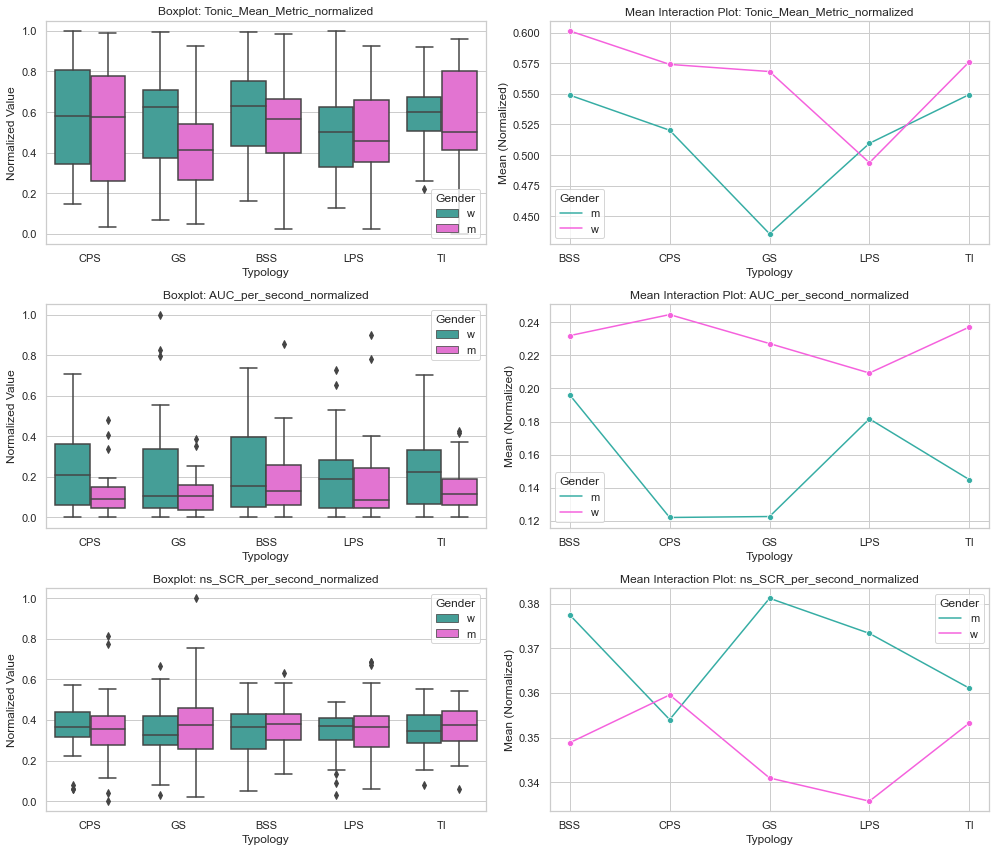

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Ensure the relevant columns are present
normalized_metrics = ["Tonic_Mean_Metric_normalized", "AUC_per_second_normalized", "ns_SCR_per_second_normalized"]

# Set seaborn style
sns.set_style("whitegrid")

# Define custom colors
husl_colors = sns.color_palette("husl", 8)
selected_colors_swapped = [husl_colors[4], husl_colors[7]]

# Create figure
fig, axes = plt.subplots(3, 2, figsize=(14, 12))  # 3 metrics × (boxplot + lineplot)

# Loop through each metric
for idx, metric in enumerate(normalized_metrics):
    ### 1️⃣ Boxplot: Distribution per Typology × Gender
    sns.boxplot(
        data=eda_normalized_df,
        x="Typology", 
        y=metric, 
        hue="Gender", 
        ax=axes[idx, 0],
        palette=selected_colors_swapped
    )
    axes[idx, 0].set_title(f"Boxplot: {metric}")
    axes[idx, 0].set_ylabel("Normalized Value")

    ### 2️⃣ Line plot: Mean per Typology × Gender
    df_means = eda_normalized_df.groupby(["Typology", "Gender"])[metric].mean().reset_index()
    
    sns.lineplot(
        data=df_means, 
        x="Typology", 
        y=metric, 
        hue="Gender", 
        marker="o",
        ax=axes[idx, 1],
        palette=selected_colors_swapped
    )
    axes[idx, 1].set_title(f"Mean Interaction Plot: {metric}")
    axes[idx, 1].set_ylabel("Mean (Normalized)")

# Adjust layout
plt.tight_layout()
plt.show()


In [10]:
df_means = eda_normalized_df.groupby(["Typology", "Gender"])[normalized_metrics].mean().reset_index()
df_medians = eda_normalized_df.groupby(["Typology", "Gender"])[normalized_metrics].median().reset_index()

df_means

,Typology,Gender,Tonic_Mean_Metric_normalized,AUC_per_second_normalized,ns_SCR_per_second_normalized
0,BSS,m,0.548892,0.196060,0.377495
1,BSS,w,0.601307,0.231863,0.348857
2,CPS,m,0.520272,0.122123,0.354036
3,CPS,w,0.573988,0.244546,0.359566
4,GS,m,0.435780,0.122695,0.381223
5,GS,w,0.568162,0.227070,0.340953
6,LPS,m,0.509588,0.181617,0.373351
7,LPS,w,0.493758,0.209288,0.335761
8,TI,m,0.549408,0.144952,0.361075
9,TI,w,0.576114,0.237016,0.353256


In [18]:
df_means.to_pickle("df_means.pkl")

### 18. Run statistics

#### 18.1 GS as Reference Category

In [25]:
## Version: Per seconds
import pandas as pd
import statsmodels.formula.api as smf

# Make a copy of the dataframe before modifying it
eda_lmm_df = eda_normalized_df.copy()

# Rename problematic column for compatibility with Patsy (formula parser)
eda_lmm_df = eda_lmm_df.rename(
    columns={"ns-SCR_per_second_normalized": "ns_SCR_per_second_normalized"}
)

def calculate_and_fit_lmm(df, metric_column):
    """
    Preprocess the data and fit a Linear Mixed Effects Model using the specified metric.
    """
    df = df.copy()
    
    # Remove rows where Gender is NaN
    df = df[df["Gender"].notna()]
    
    # Ensure relevant columns are categorical
    df["Participant"] = df["Participant"].astype("category")
    df["Typology"] = df["Typology"].astype("category")
    df["Position"] = df["Position"].astype("category")
    df["Gender"] = df["Gender"].astype("category")

    # Ensure Typology and Position categories are updated
    df["Typology"] = df["Typology"].cat.remove_unused_categories()
    df["Position"] = df["Position"].cat.remove_unused_categories()    

    # Ensure Gender is correctly formatted
    df = df[df["Gender"].isin(["m", "w"])]  # Keep only valid categories
    df["Gender"] = df["Gender"].cat.remove_unused_categories()
    df["Gender"] = df["Gender"].cat.reorder_categories(["m", "w"], ordered=True)  # Set "m" as reference

    # Set "CPS" as the reference category for Typology
    df["Typology"] = df["Typology"].cat.reorder_categories(["GS", "CPS", "LPS", "BSS", "TI"], ordered=True)

    # Fit the Linear Mixed Effects Model
    formula = f"{metric_column} ~ Typology * Position * Gender"
    lmm = smf.mixedlm(formula, data=df, groups=df["Participant"])
    lmm_fit = lmm.fit(method="lbfgs")  # Using 'lbfgs' optimization

    return lmm_fit, df


# **Run the LMM for Each Metric**
dependent_vars = [
    "Tonic_Mean_Metric_normalized",
    "AUC_per_second_normalized",
    "ns_SCR_per_second_normalized"  # Now with an underscore!
]

# Dictionary to store LMM results
lmm_results = {}

# Iterate over each dependent variable and fit an LMM
for metric in dependent_vars:
    print(f"\nFitting LMM for {metric}...\n")
    
    # Run the LMM
    lmm_fit, processed_df = calculate_and_fit_lmm(eda_lmm_df, metric)
    
    # Store results
    lmm_results[metric] = lmm_fit
    
    # Print summary of the LMM result
    print(lmm_fit.summary())



Fitting LMM for Tonic_Mean_Metric_normalized...

                            Mixed Linear Model Regression Results
Model:                   MixedLM       Dependent Variable:       Tonic_Mean_Metric_normalized
No. Observations:        294           Method:                   REML                        
No. Groups:              34            Scale:                    0.0158                      
Min. group size:         1             Log-Likelihood:           99.3949                     
Max. group size:         10            Converged:                Yes                         
Mean group size:         8.6                                                                 
---------------------------------------------------------------------------------------------
                                                   Coef.  Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------------------------------------------
Intercept                             

#### 18.2 Histogram of Residuals

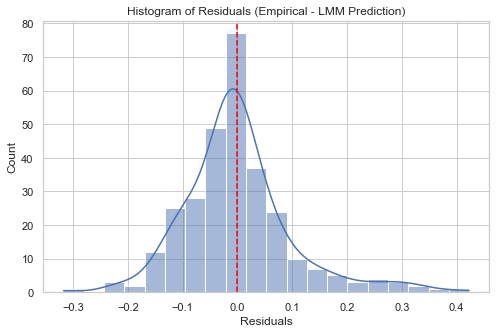

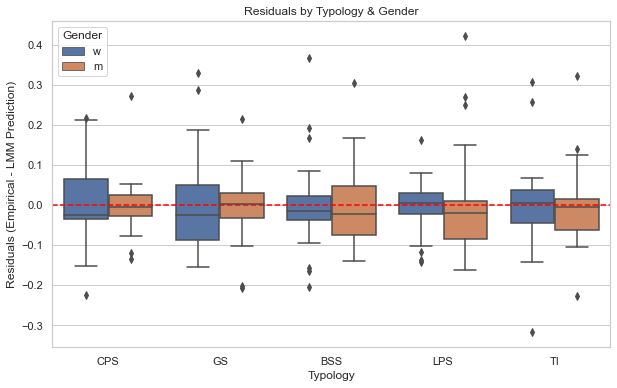

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

# Falls noch nicht berechnet: Vorhersagen aus dem neuesten LMM
eda_lmm_df["LMM_Predictions"] = lmm_results["AUC_per_second_normalized"].fittedvalues

# Berechnung der Residuen (Empirischer Wert - Modellvorhersage)
eda_lmm_df["Residuals"] = eda_lmm_df["AUC_per_second_normalized"] - eda_lmm_df["LMM_Predictions"]

# 🔹 1️⃣ Histogramm der Residuen
fig, ax = plt.subplots(figsize=(8, 5))
sns.histplot(eda_lmm_df["Residuals"], bins=20, kde=True, ax=ax)
ax.axvline(0, color="red", linestyle="--")
ax.set_title("Histogram of Residuals (Empirical - LMM Prediction)")
ax.set_xlabel("Residuals")
ax.set_ylabel("Count")
plt.show()

# 🔹 2️⃣ Boxplot der Residuen nach Typology & Gender
fig, ax = plt.subplots(figsize=(10, 6))
sns.boxplot(data=eda_lmm_df, x="Typology", y="Residuals", hue="Gender", ax=ax)
ax.axhline(0, color="red", linestyle="--")
ax.set_title("Residuals by Typology & Gender")
ax.set_ylabel("Residuals (Empirical - LMM Prediction)")
plt.show()


#### 18.3  Interaction Plots

In [39]:
import os
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Create output directory for saving per-second interaction plots
output_dir_per_second_fixed = "interaction_plots_per_second_fixed"
os.makedirs(output_dir_per_second_fixed, exist_ok=True)

# Set seaborn style and aesthetics
sns.set_style("whitegrid", {'axes.spines.top': False, 'axes.spines.right': False})
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 14

# Use the swapped Husl colors (blue-green for men, pink-orange for women)
husl_colors = sns.color_palette("husl", 8)
selected_colors_swapped = [husl_colors[4], husl_colors[7]]

# Metric name mapping for nicer titles
metric_titles = {
    "Tonic_Mean_Metric_normalized": "Mean Tonic Component",
    "AUC_per_second_normalized": "Phasic AUC",
    "ns_SCR_per_second_normalized": "Non-specific SCRs"
}

# Define the fixed-effect coefficients for each metric (per-second normalized versions)
metrics_per_second = {
    "Tonic_Mean_Metric_normalized": {
        "Intercept": 0.483,
        "Typology_CPS": 0.074,
        "Typology_LPS": 0.049,
        "Typology_BSS": 0.076,
        "Typology_TI": 0.108,
        "Position_Peripheral": -0.012,
        "Gender_w": 0.135,
        "Interaction_Position_Gender": 0.006,
        "Typology_CPS:Position_Peripheral": 0.011,
        "Typology_LPS:Position_Peripheral": -0.033,
        "Typology_BSS:Position_Peripheral": 0.039,
        "Typology_TI:Position_Peripheral": -0.071,
        "Typology_CPS:Gender_w": -0.091,
        "Typology_LPS:Gender_w": -0.113,
        "Typology_BSS:Gender_w": -0.029,
        "Typology_TI:Gender_w": -0.057
    },
    "AUC_per_second_normalized": {
        "Intercept": 0.101,
        "Typology_CPS": 0.014,
        "Typology_LPS": 0.108,
        "Typology_BSS": 0.072,
        "Typology_TI": 0.053,
        "Position_Peripheral": 0.040,
        "Gender_w": 0.131,
        "Interaction_Position_Gender": -0.039,
        "Typology_CPS:Position_Peripheral": -0.019,
        "Typology_LPS:Position_Peripheral": -0.093,
        "Typology_BSS:Position_Peripheral": 0.013,
        "Typology_TI:Position_Peripheral": -0.056,
        "Typology_CPS:Gender_w": -0.008,
        "Typology_LPS:Gender_w": -0.144,
        "Typology_BSS:Gender_w": -0.068,
        "Typology_TI:Gender_w": -0.036
    },
    "ns_SCR_per_second_normalized": {
        "Intercept": 0.340,
        "Typology_CPS": -0.009,
        "Typology_LPS": 0.037,
        "Typology_BSS": 0.044,
        "Typology_TI": -0.000,
        "Position_Peripheral": 0.052,
        "Gender_w": 0.019,
        "Interaction_Position_Gender": -0.102,
        "Typology_CPS:Position_Peripheral": -0.038,
        "Typology_LPS:Position_Peripheral": -0.060,
        "Typology_BSS:Position_Peripheral": -0.079,
        "Typology_TI:Position_Peripheral": -0.010,
        "Typology_CPS:Gender_w": 0.003,
        "Typology_LPS:Gender_w": -0.054,
        "Typology_BSS:Gender_w": -0.044,
        "Typology_TI:Gender_w": 0.021
    }
}

# Define categories
typologies = ["GS", "CPS", "LPS", "BSS", "TI"]
positions = ["Central", "Peripheral"]
genders = ["m", "w"]

# Function to compute predicted means with all relevant interactions
def compute_means_fixed(metric, interaction_variable, interaction_name):
    coefficients = metrics_per_second[metric]
    data = []
    for typology in typologies:
        for category in interaction_variable:
            mean = coefficients["Intercept"]
            if typology != "GS":
                mean += coefficients.get(f"Typology_{typology}", 0)
            if interaction_variable == positions and category == "Peripheral":
                mean += coefficients["Position_Peripheral"]
                if typology != "GS":
                    mean += coefficients.get(f"Typology_{typology}:Position_Peripheral", 0)
            if interaction_variable == genders and category == "w":
                mean += coefficients["Gender_w"]
                if typology != "GS":
                    mean += coefficients.get(f"Typology_{typology}:Gender_w", 0)
            data.append({"Typology": typology, interaction_name: category, "Mean": mean})
    return pd.DataFrame(data)

# Function to plot and save interaction plots
def plot_and_save_interaction_fixed(df, interaction_column, metric_key, filename, legend_title, colors):
    title_name = metric_titles.get(metric_key, metric_key)
    fig, ax = plt.subplots(figsize=(10, 6))
    for category, color in zip(df[interaction_column].unique(), colors):
        subset = df[df[interaction_column] == category]
        ax.plot(
            subset["Typology"],
            subset["Mean"],
            linestyle="-",
            marker="o",
            markersize=8,
            linewidth=2,
            label=category,
            color=color
        )
    ax.set_title(f"Interaction Plot ({title_name}): Typology × {legend_title}", fontsize=14, fontweight="bold")
    ax.set_xlabel("Urban Typologies", fontsize=12)
    ax.set_ylabel("Predicted Mean (Min-Max Normalized)", fontsize=12)
    ax.legend(title=legend_title, loc="upper left", fontsize=10)
    ax.grid(True, linestyle="--", alpha=0.6)
    plt.savefig(os.path.join(output_dir_per_second_fixed, filename), dpi=300, bbox_inches="tight")
    plt.close(fig)

# Generate and save interaction plots for each per-second metric
for metric in metrics_per_second.keys():
    df_typology_position = compute_means_fixed(metric, positions, "Position")
    df_typology_gender = compute_means_fixed(metric, genders, "Gender")

    plot_and_save_interaction_fixed(df_typology_position, "Position", metric,
                                    f"typology_position_{metric}.png", 
                                    "Position", selected_colors_swapped)

    plot_and_save_interaction_fixed(df_typology_gender, "Gender", metric,
                                    f"typology_gender_{metric}.png", 
                                    "Gender", selected_colors_swapped)

    # Create interaction plot for Position × Gender using correct full coefficients
    coefficients = metrics_per_second[metric]
    df_position_gender = pd.DataFrame({
        "Position": ["Central", "Peripheral"],
        "Mean_m": [
            coefficients["Intercept"],
            coefficients["Intercept"] + coefficients["Position_Peripheral"]
        ],
        "Mean_w": [
            coefficients["Intercept"] + coefficients["Gender_w"],
            coefficients["Intercept"] + coefficients["Position_Peripheral"] + 
            coefficients["Gender_w"] + coefficients["Interaction_Position_Gender"]
        ]
    })

    fig, ax = plt.subplots(figsize=(10, 6))
    ax.plot(["Central", "Peripheral"], df_position_gender["Mean_m"], 
            label="Gender m", color=selected_colors_swapped[0], marker="o", markersize=10, linewidth=2)
    ax.plot(["Central", "Peripheral"], df_position_gender["Mean_w"], 
            label="Gender w", color=selected_colors_swapped[1], marker="o", markersize=10, linewidth=2)
    title_name = metric_titles.get(metric, metric)
    ax.set_title(f"Interaction Plot ({title_name}): Position × Gender", fontsize=14, fontweight="bold")
    ax.set_xlabel("Position", fontsize=12)
    ax.set_ylabel("Predicted Mean (Min-Max Normalized)", fontsize=12)
    ax.legend(fontsize=10)
    ax.grid(True, linestyle="--", alpha=0.6)
    plt.savefig(os.path.join(output_dir_per_second_fixed, f"position_gender_{metric}.png"), dpi=300, bbox_inches="tight")
    plt.close(fig)


In [37]:
## Three-Way Inteaction Plot

import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Neues Ausgabe-Verzeichnis erstellen
output_dir_3way = "interaction_plots_typology_position_gender"
os.makedirs(output_dir_3way, exist_ok=True)

# Farben wie gehabt, mit transparenterem Alpha für "Peripheral"
husl_colors = sns.color_palette("husl", 8)
base_colors = {
    "m": husl_colors[4],  # blaugrün
    "w": husl_colors[7]   # pinkorange
}

# Transparente Versionen für Peripheral (alpha muss in Plot gesetzt werden)
line_styles = {
    ("m", "Central"): {"linestyle": "-", "alpha": 1.0, "marker": "o"},
    ("m", "Peripheral"): {"linestyle": "--", "alpha": 0.5, "marker": "s"},
    ("w", "Central"): {"linestyle": "-", "alpha": 1.0, "marker": "o"},
    ("w", "Peripheral"): {"linestyle": "--", "alpha": 0.5, "marker": "s"},
}

# Mapping für metrische Namen in lesbare Titel
metric_titles = {
    "AUC_per_second_normalized": "Phasic AUC",
    "Tonic_Mean_Metric_normalized": "Mean Tonic Component",
    "ns_SCR_per_second_normalized": "Non-specific SCRs"
}

# Metriken definieren
metrics = {
    "AUC_per_second_normalized": {
        "Intercept": 0.101,
        "Typology_CPS": 0.014,
        "Typology_LPS": 0.108,
        "Typology_BSS": 0.072,
        "Typology_TI": 0.053,
        "Position_Peripheral": 0.040,
        "Gender_w": 0.131,
        "Interaction_Position_Gender": -0.039,
        "Typology_CPS:Position_Peripheral": -0.019,
        "Typology_LPS:Position_Peripheral": -0.093,
        "Typology_BSS:Position_Peripheral": 0.013,
        "Typology_TI:Position_Peripheral": -0.056,
        "Typology_CPS:Gender_w": -0.008,
        "Typology_LPS:Gender_w": -0.144,
        "Typology_BSS:Gender_w": -0.068,
        "Typology_TI:Gender_w": -0.036,
        "Typology_CPS:Position_Peripheral:Gender_w": 0.018,
        "Typology_LPS:Position_Peripheral:Gender_w": 0.118,
        "Typology_BSS:Position_Peripheral:Gender_w": -0.029,
        "Typology_TI:Position_Peripheral:Gender_w": 0.006,
    },
    "Tonic_Mean_Metric_normalized": {
        "Intercept": 0.483,
        "Typology_CPS": 0.074,
        "Typology_LPS": 0.049,
        "Typology_BSS": 0.076,
        "Typology_TI": 0.108,
        "Position_Peripheral": -0.012,
        "Gender_w": 0.135,
        "Interaction_Position_Gender": -0.103,
        "Typology_CPS:Position_Peripheral": 0.011,
        "Typology_LPS:Position_Peripheral": -0.033,
        "Typology_BSS:Position_Peripheral": 0.039,
        "Typology_TI:Position_Peripheral": -0.071,
        "Typology_CPS:Gender_w": -0.091,
        "Typology_LPS:Gender_w": -0.113,
        "Typology_BSS:Gender_w": -0.029,
        "Typology_TI:Gender_w": -0.057,
        "Typology_CPS:Position_Peripheral:Gender_w": 0.001,
        "Typology_LPS:Position_Peripheral:Gender_w": 0.053,
        "Typology_BSS:Position_Peripheral:Gender_w": -0.034,
        "Typology_TI:Position_Peripheral:Gender_w": 0.043,
    },
    "ns_SCR_per_second_normalized": {
        "Intercept": 0.340,
        "Typology_CPS": -0.009,
        "Typology_LPS": 0.037,
        "Typology_BSS": 0.044,
        "Typology_TI": -0.000,
        "Position_Peripheral": 0.052,
        "Gender_w": 0.019,
        "Interaction_Position_Gender": -0.102,
        "Typology_CPS:Position_Peripheral": -0.038,
        "Typology_LPS:Position_Peripheral": -0.060,
        "Typology_BSS:Position_Peripheral": -0.079,
        "Typology_TI:Position_Peripheral": -0.010,
        "Typology_CPS:Gender_w": 0.003,
        "Typology_LPS:Gender_w": -0.054,
        "Typology_BSS:Gender_w": -0.044,
        "Typology_TI:Gender_w": 0.021,
        "Typology_CPS:Position_Peripheral:Gender_w": 0.081,
        "Typology_LPS:Position_Peripheral:Gender_w": 0.087,
        "Typology_BSS:Position_Peripheral:Gender_w": 0.091,
        "Typology_TI:Position_Peripheral:Gender_w": -0.003,
    }
}

# Kategorien definieren
typologies = ["GS", "CPS", "LPS", "BSS", "TI"]
positions = ["Central", "Peripheral"]
genders = ["m", "w"]

# Plot für jede Metrik erstellen
for metric_name, coefficients in metrics.items():
    data = []
    for gender in genders:
        for position in positions:
            for typ in typologies:
                pred = coefficients["Intercept"]
                if typ != "GS":
                    pred += coefficients.get(f"Typology_{typ}", 0)
                if position == "Peripheral":
                    pred += coefficients["Position_Peripheral"]
                    if typ != "GS":
                        pred += coefficients.get(f"Typology_{typ}:Position_Peripheral", 0)
                if gender == "w":
                    pred += coefficients["Gender_w"]
                    if typ != "GS":
                        pred += coefficients.get(f"Typology_{typ}:Gender_w", 0)
                    if position == "Peripheral":
                        pred += coefficients["Interaction_Position_Gender"]
                        if typ != "GS":
                            pred += coefficients.get(f"Typology_{typ}:Position_Peripheral:Gender_w", 0)
                data.append({
                    "Typology": typ,
                    "Gender": gender,
                    "Position": position,
                    "PredictedMean": pred
                })

    df_pred = pd.DataFrame(data)

    plt.figure(figsize=(10, 6))
    for (gender, position), group_df in df_pred.groupby(["Gender", "Position"]):
        style = line_styles[(gender, position)]
        color = base_colors[gender]
        plt.plot(group_df["Typology"], group_df["PredictedMean"],
                 label=f"{gender.upper()} – {position}",
                 linestyle=style["linestyle"], marker=style["marker"], linewidth=2,
                 color=color, alpha=style["alpha"])

    title_name = metric_titles.get(metric_name, metric_name)
    plt.title(f"Interaction Plot ({title_name}): Typology × Position × Gender", fontsize=14, fontweight="bold")
    plt.xlabel("Urban Typology", fontsize=12)
    plt.ylabel("Predicted Mean (Normalized)", fontsize=12)
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.legend(title="Group", fontsize=10)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir_3way, f"typology_position_gender_{metric_name}.png"), dpi=300)
    plt.close()
